# Example Workflow for Computational Oncology

We will show how the recommended tools can be applied to do analysis in a sample cancer dataset. We chose [Laughney](https://www.nature.com/articles/s41591-019-0750-6),
because it has a good representation of both tumor and immune cells in lung cancer.

This is what they have to say about the characteristics of the study:

We transcriptionally profiled 41,384 single cells obtained from fresh surgical human samples taken from non-tumour-involved lung (n = 4), primary lung adenocarcinomas (n = 8; 7 untreated and 1 post neo-adjuvant chemotherapy), as well as brain (n = 3), bone (n = 1), and adrenal (n = 1) lung adenocarcinoma metastases. These samples were derived from patients spanning various stages of tumour progression without enrichment for a specific cell type, such that the entire tumour and its microenvironment were sampled in an unbiased manner. Data from all patients were merged to create a global cell atlas of the normal lung, primary tumours, and metastases.

We will focus on the primary lung to avoid any sophisticated integration

## Sequence Annotation

In this notebook we work directly with the count matrix and assume that the annotation has been already done.
In the case of Laughney it was done with CellRanger, which simplifies the procedure greatly. 
Though **STARSolo** is often used and is much more flexible.


Care has to be taken in this step, because a faulty annotation would
bias all the following analysis. When in doubt, these tools also come
with possible quality control measures. 

There are two main annotations
used for sequences, the **Ensembl ID**, whose main feature is that it is unique
and the **gene symbol**, that is more closely related to its discovery
or function. When using different tools, conversion from Ensembl ID
to gene symbol or vice versa is often needed and this depends very much
on the reference database used. Almost all reference datasets come from
the Ensembl website, but older platforms use the legacy hg19 reference.


Additionaly, the database can consider not only genes but miRNAs, non-coding 
RNAs and others.

## Import libraries and data

We import lots of libraries we will use later and also, the data.

Our main analysis pipeline will be through **Scanpy**, though we will have to change to R, for certain tools.
The basic approach is inspired in [Luecken 2019](https://www.embopress.org/doi/full/10.15252/msb.20188746) and the magnficient book/webiste they put together https://www.sc-best-practices.org/.

Scanpy works by using a central object named **AnnData** that is specifically designed for count matrices.
It decouples the rows names in the `.obs` attribute and the columns in `.var` and these
are called layers.

Additional
info can be saved in other special layers that don't have to have the dimensions of the
main count matrix, like `.obsm`  for meta info about the rows or `.uns` for info that is 
not tied to anything.

<img src="https://raw.githubusercontent.com/scverse/anndata/main/docs/_static/img/anndata_schema.svg" alt= “” width="600" height="600">


In [1]:
#For downloads
import gdown, os, gzip, shutil

# Basic data management and plotting
import pandas as pd
import numpy as np
from scipy import sparse
import matplotlib.pyplot as plt

# Scanpy fundamentals
import anndata as ad
import scanpy as sc
import seaborn as sb

# sc.settings.set_figure_params(dpi=200, frameon=False)
sc.set_figure_params(figsize=(6, 6))


# The automatic annotation library
import scarches as sca
import triku as tk
from ikarus import classifier, utils, data

import rpy2.rinterface_lib.callbacks
import logging
from rpy2.robjects import pandas2ri
import rpy2.robjects as robjects

# Set the graphics device
robjects.r('options(bitmapType="cairo")')
import anndata2ri

# Ignore R warning messages
#Note: this can be commented out to get more verbose R output
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)

# Automatically convert rpy2 outputs to pandas dataframes
pandas2ri.activate()
anndata2ri.activate()
%load_ext rpy2.ipython

/usr/local/lib/python3.11/site-packages/scvi/_settings.py:63: UserWarning: Since v1.0.0, scvi-tools no longer uses a random seed by default. Run `scvi.settings.seed = 0` to reproduce results from previous versions.
  self.seed = seed
/usr/local/lib/python3.11/site-packages/scvi/_settings.py:70: UserWarning: Setting `dl_pin_memory_gpu_training` is deprecated in v1.0 and will be removed in v1.1. Please pass in `pin_memory` to the data loaders instead.
  self.dl_pin_memory_gpu_training = (
/usr/local/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
 captum (see https://github.com/pytorch/captum).


In [2]:
%%R

library(PsiNorm)
library(scuttle)
library(Matrix)
library(scry)

Loading required package: SingleCellExperiment
Loading required package: SummarizedExperiment
Loading required package: MatrixGenerics
Loading required package: matrixStats

Attaching package: ‘MatrixGenerics’

The following objects are masked from ‘package:matrixStats’:

    colAlls, colAnyNAs, colAnys, colAvgsPerRowSet, colCollapse,
    colCounts, colCummaxs, colCummins, colCumprods, colCumsums,
    colDiffs, colIQRDiffs, colIQRs, colLogSumExps, colMadDiffs,
    colMads, colMaxs, colMeans2, colMedians, colMins, colOrderStats,
    colProds, colQuantiles, colRanges, colRanks, colSdDiffs, colSds,
    colSums2, colTabulates, colVarDiffs, colVars, colWeightedMads,
    colWeightedMeans, colWeightedMedians, colWeightedSds,
    colWeightedVars, rowAlls, rowAnyNAs, rowAnys, rowAvgsPerColSet,
    rowCollapse, rowCounts, rowCummaxs, rowCummins, rowCumprods,
    rowCumsums, rowDiffs, rowIQRDiffs, rowIQRs, rowLogSumExps,
    rowMadDiffs, rowMads, rowMaxs, rowMeans2, rowMedians, rowMins,
    rowOr

You have to change these paths so that it points to a place in your system

In [3]:
dataset_str = 'laughney_massague_2020_nsclc'
data_dir = '/root/datos/maestria/netopaas/luca/data/12_input_adatas'
backup_dir = '/root/datos/maestria/netopaas/comp_onco_nb'

Download the sample dataset in h5ad format for this example notebook. It is the data from [Laughney et. al](https://www.nature.com/articles/s41591-019-0750-6).

In [4]:
adata = ad.read_h5ad(f'{data_dir}/{dataset_str}.h5ad')

# IMPORTANT we only use the tumor samples to avoid much variation
adata = adata[adata.obs.origin == 'tumor_primary']
adata.obs

,sample,patient,origin,condition,tissue
120703408884123_0,GSM3516672,LX682,tumor_primary,LUAD,lung
120703409633700_0,GSM3516672,LX682,tumor_primary,LUAD,lung
120703423507166_0,GSM3516672,LX682,tumor_primary,LUAD,lung
120703423561070_0,GSM3516672,LX682,tumor_primary,LUAD,lung
120703436306869_0,GSM3516672,LX682,tumor_primary,LUAD,lung
...,...,...,...,...,...
241114562579174_14,GSM3516665,LX675,tumor_primary,LUAD,lung
241114576537973_14,GSM3516665,LX675,tumor_primary,LUAD,lung
241114577300724_14,GSM3516665,LX675,tumor_primary,LUAD,lung
241114589087470_14,GSM3516665,LX675,tumor_primary,LUAD,lung


## Pre-processing and Quality Control

### Filtering

Data quality control can be split into cell QC and gene QC. Typical quality measures for assessing the quality of a cell include the number of molecule counts (UMIs), the number of expressed genes, and the fraction of counts that are mitochondrial. A high fraction of mitochondrial reads being picked up can indicate cell stress, as there is a low proportion of nuclear mRNA in the cell. It should be noted that high mitochondrial RNA fractions can also be biological signals indicating elevated respiration.

Let's see how many mitochondrila genes there and if they are indeed annotated with `MT-`

In [5]:
a = adata.var_names.str.startswith("MT-")
# a = barcodes.index
for i in range(0,len(a)):
    if(a[i] == True):
        print(adata.var_names[i])
del a

MT-ATP6
MT-ATP8
MT-CO1
MT-CO2
MT-CO3
MT-CYB
MT-ND1
MT-ND2
MT-ND3
MT-ND4
MT-ND4L
MT-ND5
MT-ND6


In [6]:
# Quality control - calculate QC covariates
adata.var["mt"] = adata.var_names.str.startswith("MT-")
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True)
#Note: this function computes: 
# - `adata.obs['pct_counts_mt']`
# - `adata.obs['total_counts_mt']`
# - `adata.obs['total_counts'`]
# - `adata.obs['n_genes_by_counts']`

adata.obs['log_counts'] = np.log(adata.obs['total_counts'])

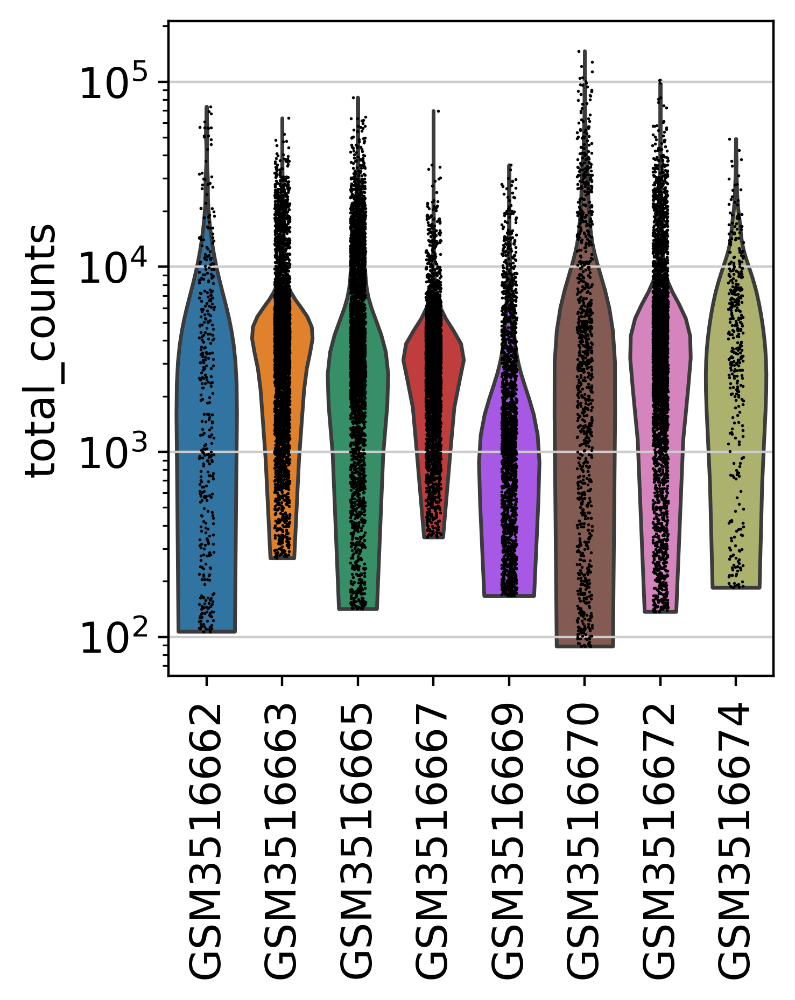

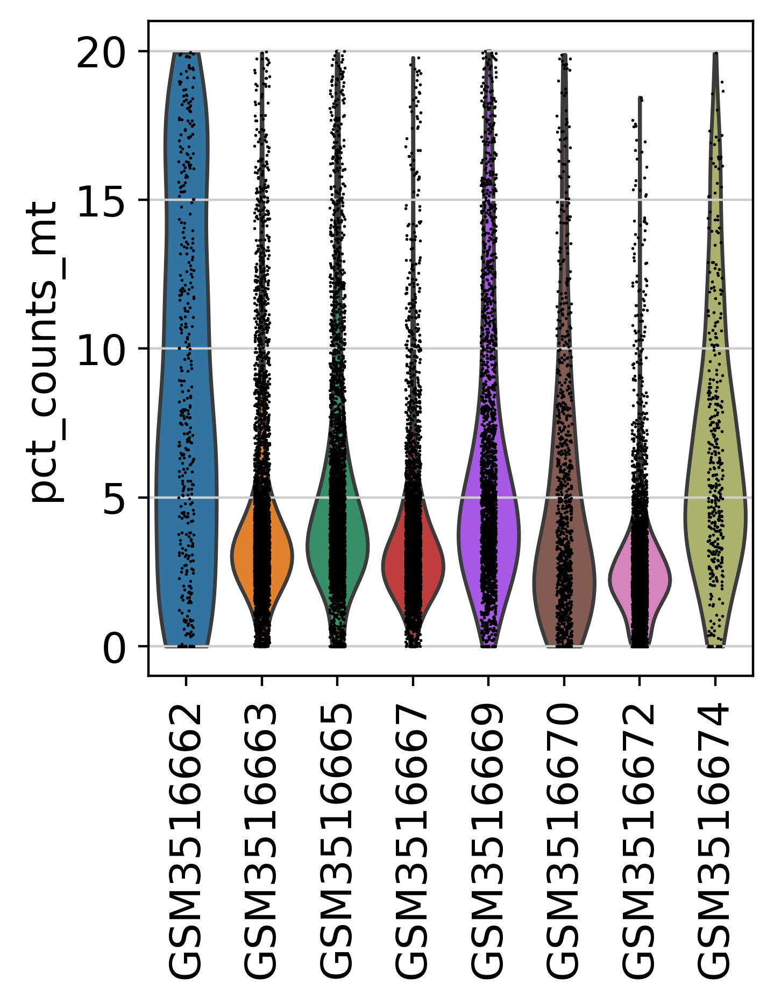

In [7]:
# Quality control - plot QC metrics
#Sample quality plots
sc.pl.violin(adata, 'total_counts', groupby='sample', size=1, log=True, cut=0, rotation=90)
sc.pl.violin(adata, 'pct_counts_mt', groupby='sample', legend=True, rotation=90)

The plots show that the GSM351662 sample has the poorest quality in comparison. The counts per cell are still sufficiently high to process these cells, and the fraction of mitochondrial reads (MT frac) for most cells are still far below 20-25%, which are the typical filtering thresholds.

We could perform QC filtering per sample here to address this issue, yet the mode of the distributions look similar to other samples (e.g., 'GSM3516669'). It may be worth keeping in mind that one sample has a few poorer quality cells though.

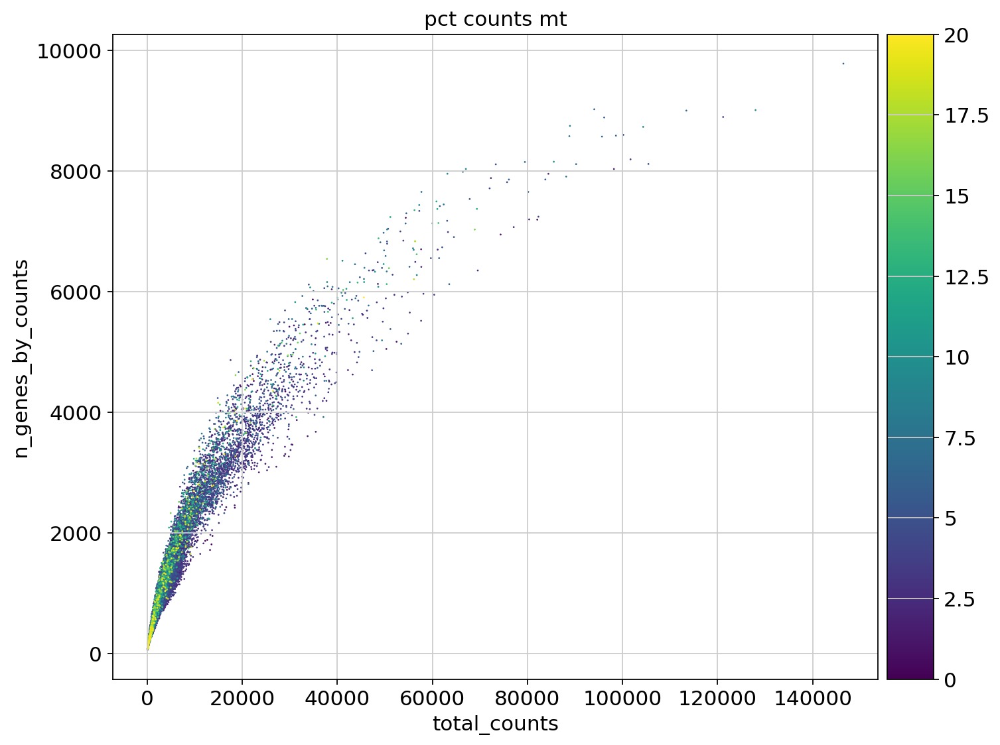

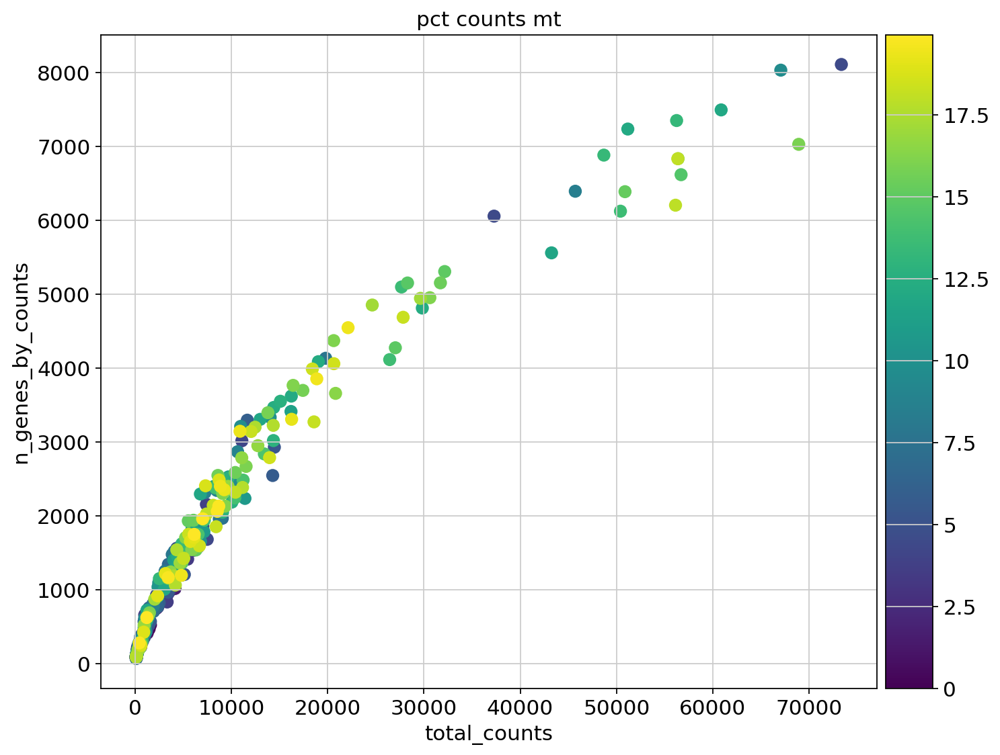

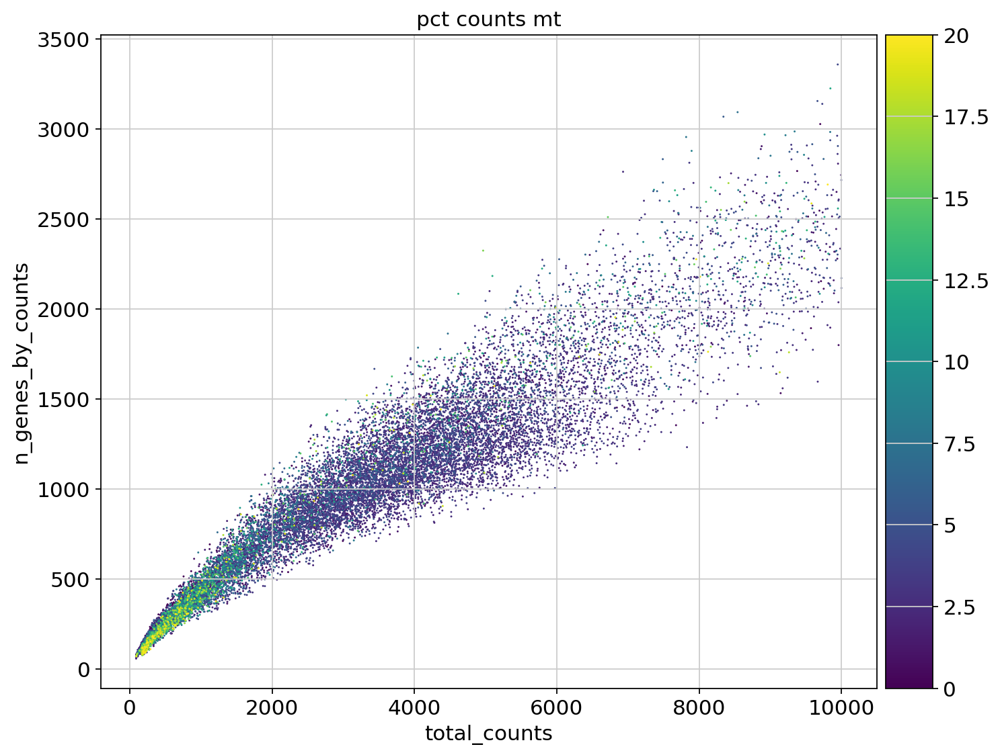

In [9]:
#Data quality summary plots
sc.pl.scatter(adata, 'total_counts', 'n_genes_by_counts', color='pct_counts_mt')

sc.pl.scatter(adata[adata.obs['sample']=='GSM3516662'], 'total_counts', 'n_genes_by_counts', color='pct_counts_mt')

sc.pl.scatter(adata[ (adata.obs['sample']!='GSM3516662') & (adata.obs['total_counts']<10000)], 'total_counts', 'n_genes_by_counts', color='pct_counts_mt')


If we substract the sample with the most 
mitochondrial genes *GSM3516662*, the trend is still preserved.

The presence of high mitochondrial percentage in cells with high number of genes is probably a sign of high mitochondrial activity and not dead cells.

In [8]:
adata.obs['sample'].value_counts()

sample
GSM3516663    4566
GSM3516672    4092
GSM3516667    4014
GSM3516665    3435
GSM3516669    2017
GSM3516670     941
GSM3516662     392
GSM3516674     378
Name: count, dtype: int64

/usr/local/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


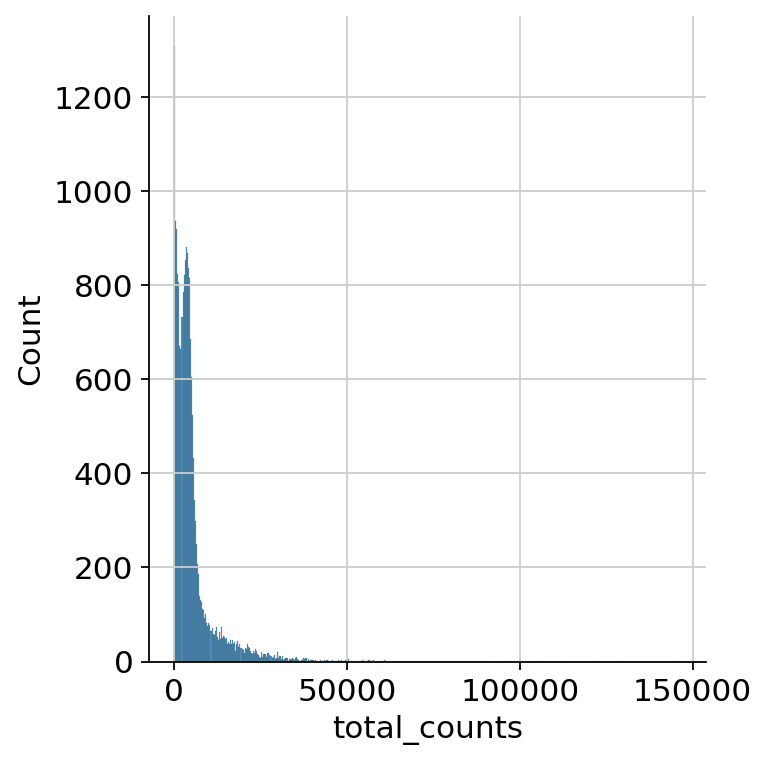

/usr/local/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


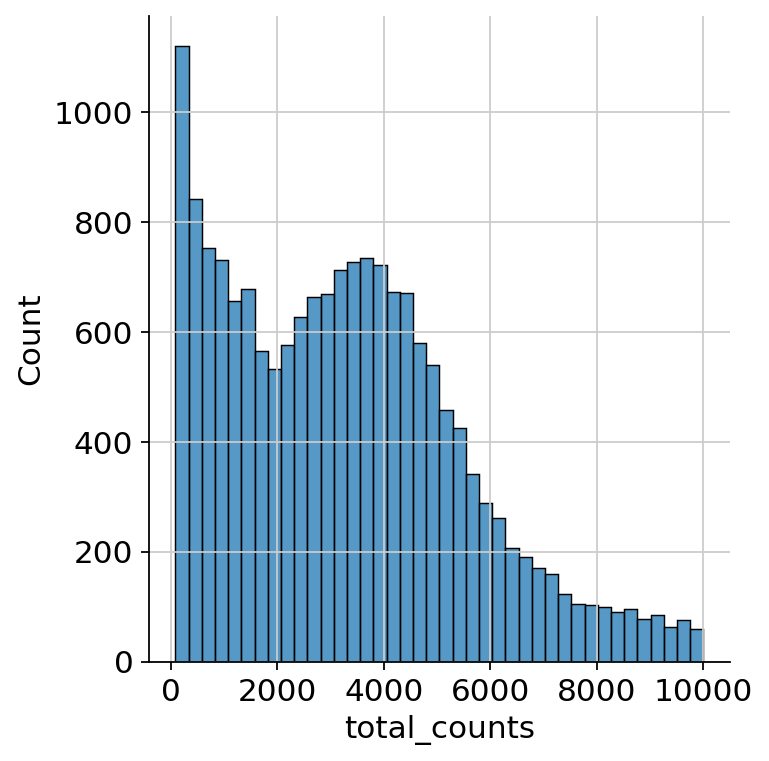

/usr/local/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


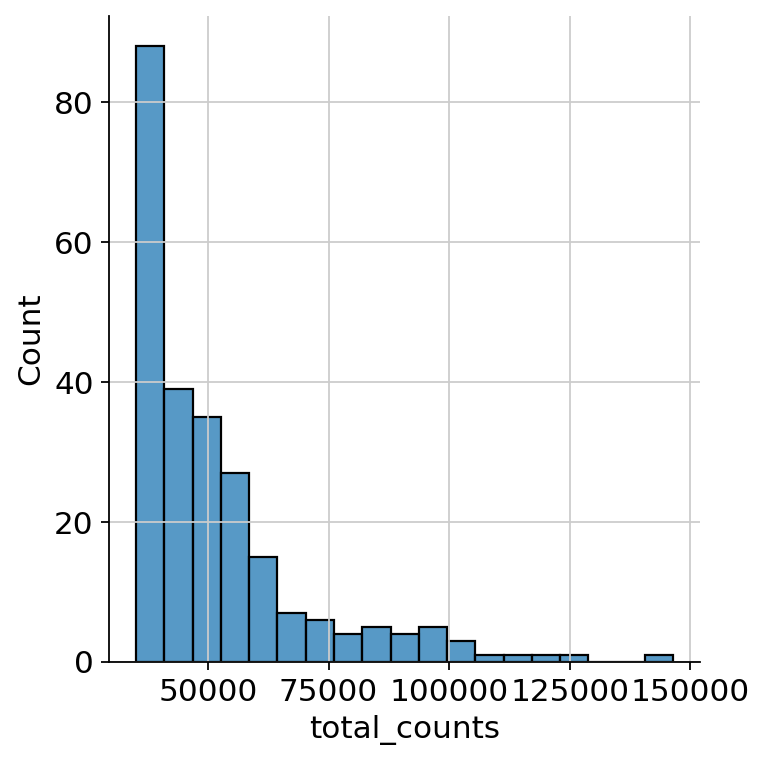

In [11]:
#Thresholding decision: counts
sb.displot(adata.obs['total_counts'], kde=False)
plt.show()

sb.displot(adata.obs['total_counts'][adata.obs['total_counts']<10000], kde=False)
plt.show()

sb.displot(adata.obs['total_counts'][adata.obs['total_counts']>35000], kde=False)
plt.show()

We see a a duble peak of many cells with very little counts, those can be dead cells or ambient RNA, though it is strange
that the counts are so high. Nevertheless, we cutoff at <1800 which is when the population of cells with very fow counts
starts to grow and >40000 when the count abruptly drops.

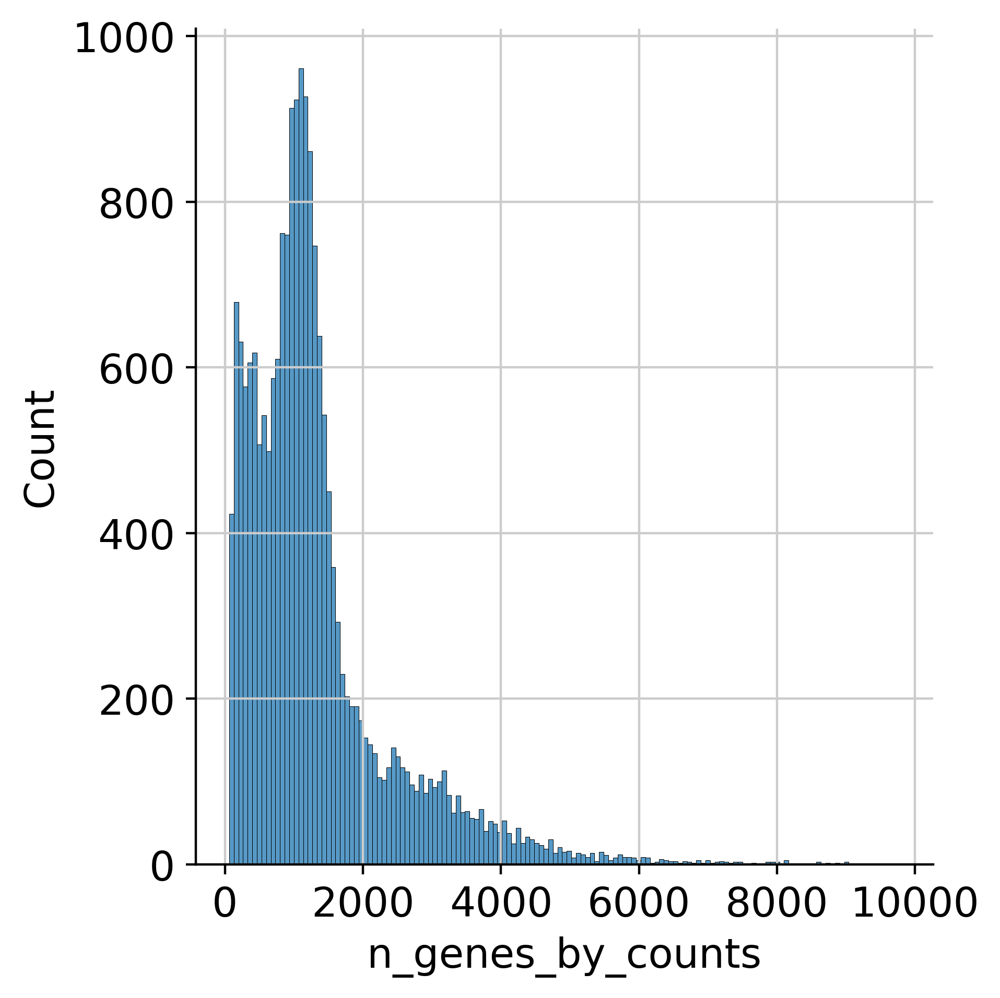

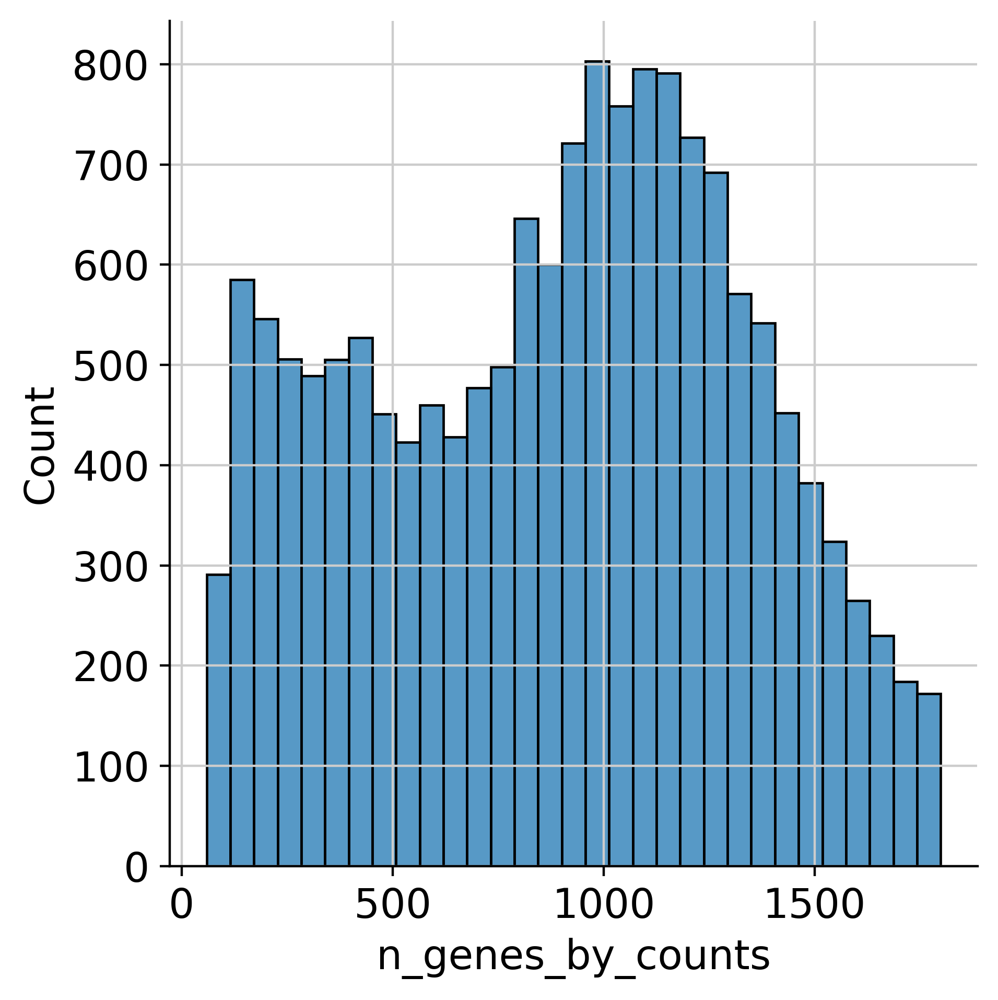

In [9]:
#Thresholding decision: genes
sb.displot(adata.obs['n_genes_by_counts'], kde=False)
plt.show()

sb.displot(adata.obs['n_genes_by_counts'][adata.obs['n_genes_by_counts']<1800], kde=False)
plt.show()

By the same critera as before as with total counts we decide the cutoffs to be <500 and >10000.

We also choose a high percentage of max % of mito genes (20%) because of there is a sample that shows mitochondrial activity.

In [10]:
thresholds = {}
thresholds['min_counts']  = 1800
thresholds['max_counts'] = 40000
thresholds['min_genes'] = 500
thresholds['max_genes'] = 10000
thresholds['max_pct_mt'] = 20

In [60]:
print("Filtering genes with min counts")
print(f"    Before: {adata.shape[1]}")
sc.pp.filter_genes(adata, min_cells=1)
print(f"    After: {adata.shape[1]}")

Filtering genes with min counts
    Before: 19616
    After: 19614


In [11]:
# very basic gene filtering - genes with 0 cells cause some downstream processes to fail.
print("Filtering genes with min counts")
print(f"    Before: {adata.shape[1]}")
sc.pp.filter_genes(adata, min_counts=5)
print(f"    After: {adata.shape[1]}")

print("Filtering genes with min counts")
print(f"    Before: {adata.shape[1]}")
sc.pp.filter_genes(adata, min_cells=1)
print(f"    After: {adata.shape[1]}")

# %%
# Apply thresholds
print("Filter by min_counts")
print(f"    Before: {adata.shape[0]}")
sc.pp.filter_cells(adata, min_counts=thresholds["min_counts"])
print(f"    After: {adata.shape[0]}")


print("Filter by max_counts")
print(f"    Before: {adata.shape[0]}")
sc.pp.filter_cells(adata, max_counts=thresholds["max_counts"])
print(f"    After: {adata.shape[0]}")


print("Filter by min_genes")
print(f"    Before: {adata.shape[0]}")
sc.pp.filter_cells(adata, min_genes=thresholds["min_genes"])
print(f"    After: {adata.shape[0]}")


print("Filter by max_genes")
print(f"    Before: {adata.shape[0]}")
sc.pp.filter_cells(adata, max_genes=thresholds["max_genes"])
print(f"    After: {adata.shape[0]}")

print("Filter by max_pct_mito")
print(f"    Before: {adata.shape[0]}")
adata = adata[adata.obs["pct_counts_mt"] < thresholds["max_pct_mt"]].copy()
print(f"    After: {adata.shape[0]}")

Filtering genes
    Before: 23278
    After: 19616
Filter by min_counts
    Before: 19835
    After: 14564
Filter by max_counts
    Before: 14564
    After: 14401
Filter by min_genes
    Before: 14401
    After: 14394
Filter by max_genes
    Before: 14394
    After: 14394
Filter by max_pct_mito
    Before: 14394
    After: 14394


It is always a good practice to save your `Anndata` after some big calculations. 
That way you will be able to start the anlysis where you left off.


There is also the possbility of using pickle to save everything every once in a while
but you have to take care to only save serializable objects in your vars.

In [12]:
# adata.write_h5ad(f'{backup_dir}/adata_filter.h5ad')
adata2 = ad.read_h5ad(f'{backup_dir}/adata_filter.h5ad')

### Normalization

We propose two different normalization methods. Due to the different nature of the outputted values and their
usefulness in different downstream analysis.


**PsiNorm** is very scalable. It proposes scale factor that changes per cell
using a Pareto distribution that is very similar to the
gamma-beta distribution porposed for UMI's but is more scalable and considers the scale free nature of biological data. It is useful for dimension reduction.

The other (**Adjusted Pearson Residuals**) considers the heterogeneity in the data and tries to avoid masking rare cells. It avoids the use of pseudo-counts, that are necessary in log-normalized data, lie the method above.
It is useful for differential expression.

#### Psinorm

PsiNorm is a new scalable between-sample normalization for single cell RNA-seq count data based on the power-law Pareto type I distribution. It can be demonstrated that the Pareto parameter is inversely proportional to the sequencing depth, it is sample specific and its estimate can be obtained for each cell independently. PsiNorm computes the shape parameter for each cellular sample and then uses it as multiplicative size factor to normalize the data. The final goal of the transformation is to align the gene expression distribution especially for those genes characterised by high expression. Note that, similar to other global scaling methods, this method does not remove batch effects, which can be dealt with downstream tools.

In [13]:
%%R -i adata -o size_factors -o log_counts

# We convert to `DelayedArray` because PsiNorm adds 1 and
# the matrix is automatically converted to dgeMatrix (dense matrix), which 
# PsiNorm does not recognize. Using `Delayedarray` the conversion is fast 
# and the operation are executed only when we acces the actual values
assay(adata, 'counts') = DelayedArray::DelayedArray(assay(adata, 'X'))
adata <- PsiNorm(adata)

# Very important to know that this method autmatically uses the sizefactors saved in the
# normalized experiment and also offsets by pseudo-counts
# that is why we don't do the transformation outside in python
adata <- logNormCounts(adata)
size_factors = sizeFactors(adata)
log_counts <- as(logcounts(adata), 'dgCMatrix')
head(size_factors)

[1] 1.2350041 0.4784239 0.5654966 0.9534775 0.8439693 0.8032677


We plot the size factors to show they are non-negative and related to the number of counts and genes per cell as expected.

Before normalizing the data, we ensure that a copy of the raw count data is kept in a separate AnnData object. This allows us to use methods downstream that require this data as input.

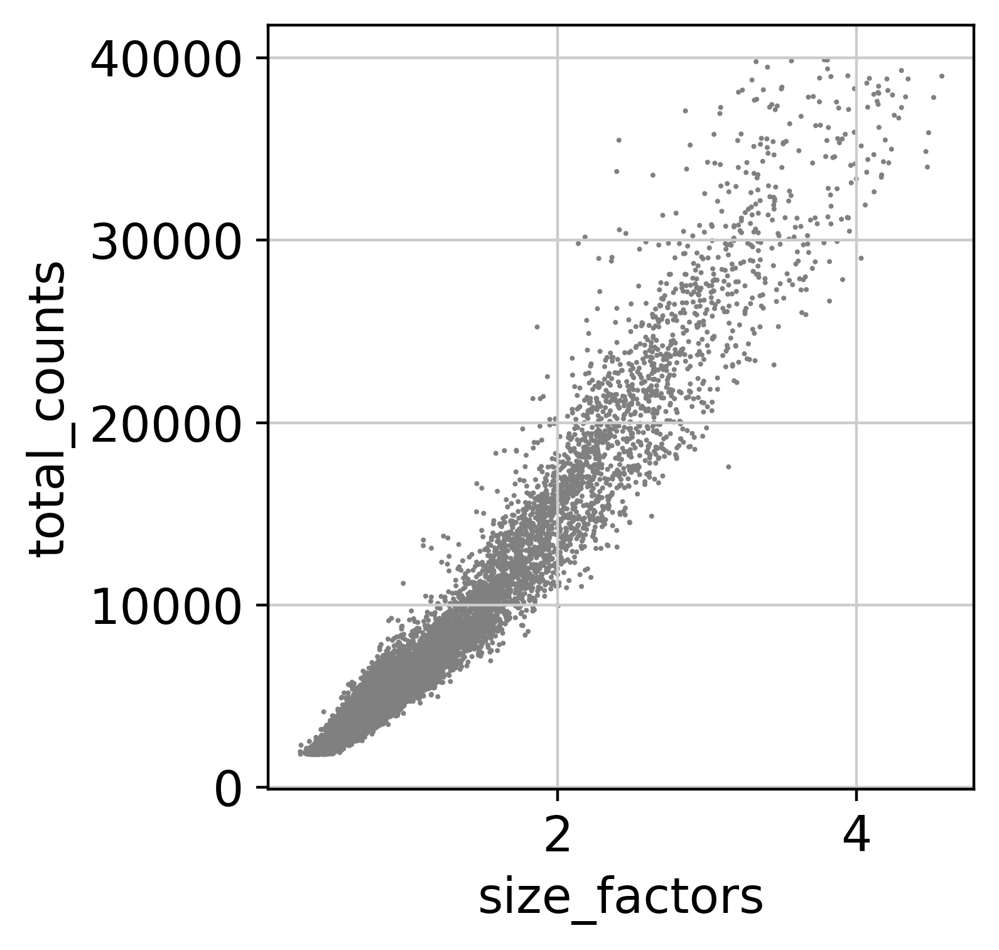

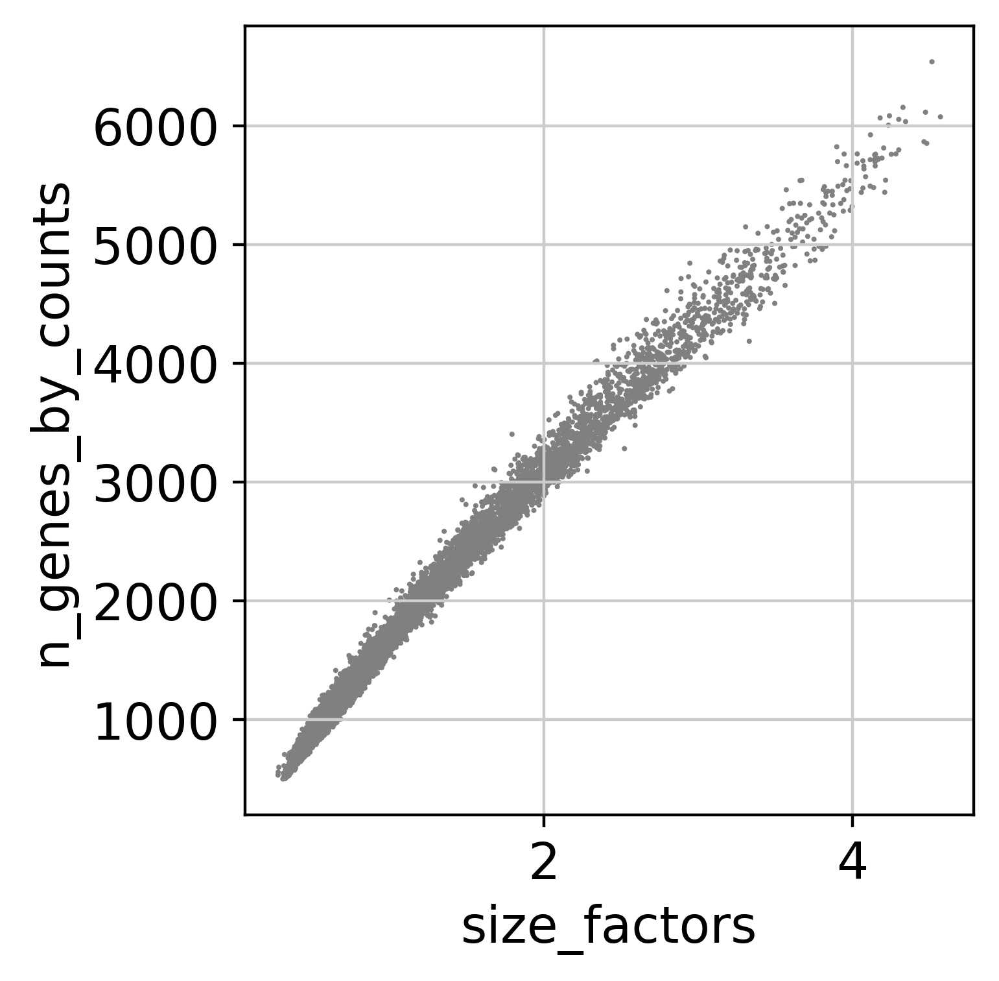

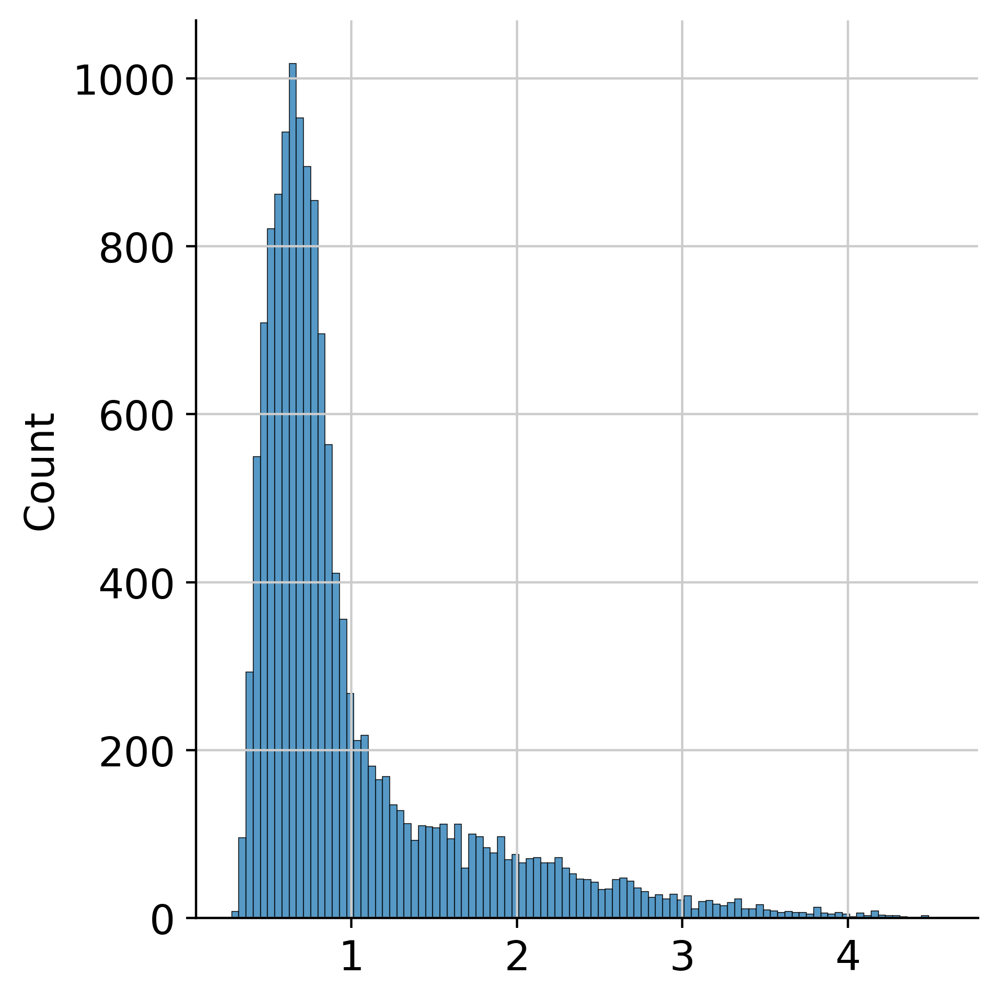

In [14]:
# Visualize the estimated size factors
adata.obs['size_factors'] = size_factors

sc.pl.scatter(adata, 'size_factors', 'total_counts')
sc.pl.scatter(adata, 'size_factors', 'n_genes_by_counts')

sb.displot(size_factors, kde=False)
plt.show()

We plot the size factors to show they are non-negative and related to the number of counts and genes per cell as expected.

Before normalizing the data, we ensure that a copy of the raw count data is kept in a separate AnnData object. This allows us to use methods downstream that require this data as input.

This provides a suitable input to downstream functions computing, e.g., Euclidean differences, which are effectively an average of the log-fold changes across genes.`m

In [15]:
#Keep the count data in a counts layer, and create one for logcounts
adata.layers["counts"] = adata.X.copy()
adata.layers["logcounts"] = log_counts.transpose()

#### Analytic Pearson Residuals

By ajdusting a generalized lineal model (GLM) to ‘regularized negative binomial regression’, that has the count depth as one if its covariates a model of the technical noise is achieved.
This model preserves the heterogeneity of the data. And is useful for **preserving rare genes**.

In [16]:
analytic_pearson = sc.experimental.pp.normalize_pearson_residuals(adata, inplace=False)
adata.layers["analytic_pearson_residuals"] = sparse.csr_matrix(analytic_pearson["X"])

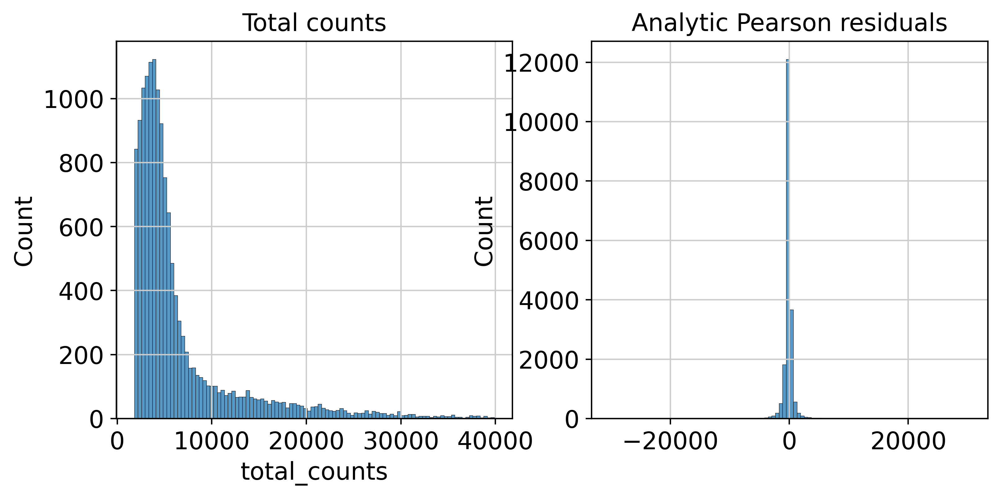

In [47]:
fig, axes = plt.subplots(1, 2, figsize=(9, 4))
p1 = sb.histplot(adata.obs["total_counts"], bins=100, kde=False, ax=axes[0])
axes[0].set_title("Total counts")

aps_arr = np.array(adata.layers["analytic_pearson_residuals"].sum(0))[0,:]
p2 = sb.histplot(
    aps_arr, bins=100, kde=False, ax=axes[1]
)
axes[1].set_title("Analytic Pearson residuals")
plt.show()

In [48]:
# adata.write_h5ad(f'{backup_dir}/adata_norm.h5ad')
adata = ad.read_h5ad(f'{backup_dir}/adata_norm.h5ad')

### Feature Selection

ScRNA-seq data is very sparse, and many features may not be informative.
Analysis with sparse matrices is often complicated because some assumptions may
not be fulfilled or the analysis might take a while.

That is why the most relevant features are selected for, to facilitate downstream analyisis. The most common and simple method, used by frameworks like Seurat an scanpy, is to select the for highly variable genes (**HVG**). This has, however the disadvantage that when using normalized counts, the variability may vary for values near to zero.

A recommended practice is to use the deviance from constant expression, but this doesn't consider different varaitional profiles depending on cell types.

That is why we will also consider a supervised apporach like **Triku**, that uses nearest nieghbours.


#### Dispersion

We can now directly call feature selection with deviance on the non-normalized counts matrix and export the bionomial deviance values as a vector.

In [49]:
%%R
sce = devianceFeatureSelection(adata, assay="counts")

In [50]:
binomial_deviance = robjects.r("rowData(sce)$binomial_deviance").T

As a next step, we now sort the vector an select the top 4,000 highly deviant genes and save them as an additional column in .var as ‘highly_deviant’. We additionally save the computed binomial deviance in case we want to sub-select a different number of highly variable genes afterwards.

In [51]:
idx = binomial_deviance.argsort()[-4000:]
mask = np.zeros(adata.var_names.shape, dtype=bool)
mask[idx] = True

adata.var["highly_deviant"] = mask
adata.var["binomial_deviance"] = binomial_deviance

Last, we visualise the feature selection results. We use a scanpy function to compute the mean and dispersion for each gene accross all cells.

In [53]:
# This function requires lognormalized values
adata.X = adata.layers['logcounts']
sc.pp.highly_variable_genes(adata)

We inspect our results by plotting dispersion versus mean for the genes and color by ‘highly_deviant’.

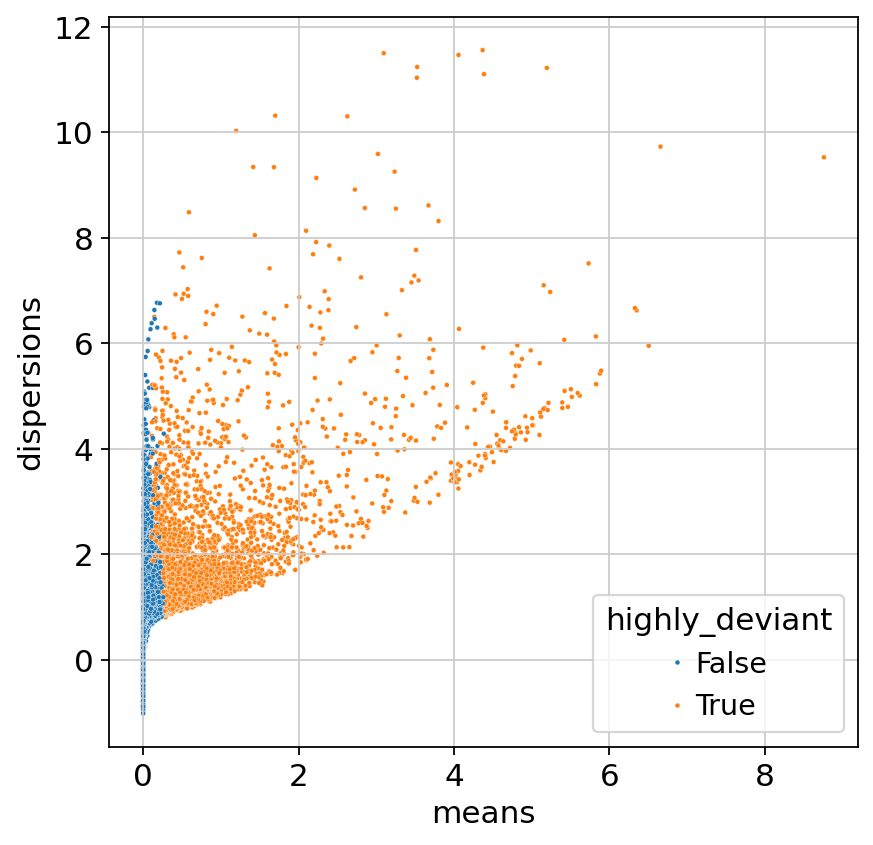

In [71]:
ax = sb.scatterplot(
    data=adata.var, x="means", y="dispersions", hue="highly_deviant", s=5
)
# ax.set_xlim(None, 1.5)
# ax.set_ylim(None, 3)
plt.show()

#### Triku

Triku is a  a feature selection method based on nearest neighbors for single-cell data. The rationale behind triku is that, if a gene is biologically relevant, it will have a localized expression. That is, cells with similar transcriptomic profiles should have similar expression of that gene.

Triku can be run with raw counts or log-counts but it generally works better with 
log normalized counts

In [ ]:
%%time
sc.pp.pca(adata)
sc.pp.neighbors(adata)

tk.tl.triku(adata)

In [70]:
adata.var['highly_variable'].sum()

2325

After running triku, results are stored in `adata.var (triku_distance, highly_variable)`, and in `adata.uns['triku_params'][None]`. Also, `adata.obsm['X_triku']` contains the matrix with the selected features. This is relevant to calculate the new round of neighbors or to do PCA again with that data.

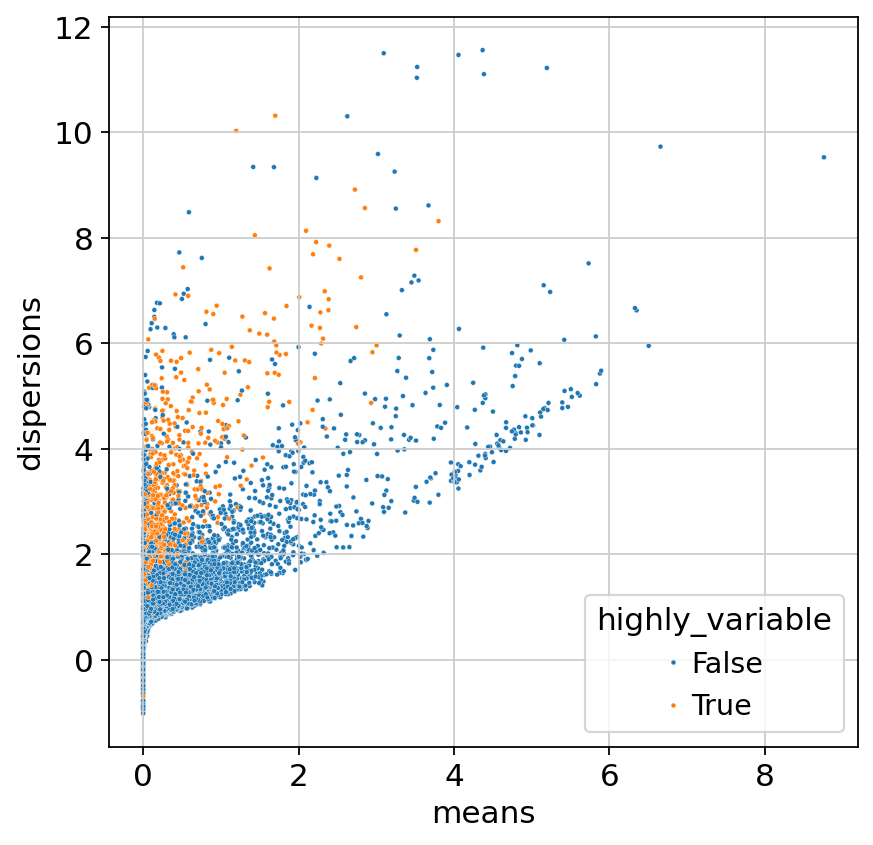

In [67]:
ax = sb.scatterplot(
    data=adata.var, x="means", y="dispersions", hue="highly_variable", s=5
)
# ax.set_xlim(None, 1.5)
# ax.set_ylim(None, 3)
plt.show()

We can see that with triku the distribution of the genes is more homogenous, though the selected genes tend to have higher means.
This rather points to the fact that the built clusters could be arbitrarily built due to the curse of dimensionality. But it
could also mean that variability in a gene is not the main factor.

Also if we calculate the percentage of zeros... the highly deviant genes remove much more zeros.
These are things to consider in the subsequent analyisis.

In [81]:
# Calculate percentage of zeros for DIPSERION
A = adata[:,adata.var['highly_variable']].layers['counts']
total_elements = A.shape[0] * A.shape[1]
non_zero_elements = A.nnz  # number of non-zero elements
zero_elements = total_elements - non_zero_elements
(zero_elements / total_elements) * 100

96.77271144936435

In [82]:
# Calculate percentage of zeros for Triku
A = adata[:,adata.var['highly_deviant']].layers['counts']
total_elements = A.shape[0] * A.shape[1]
non_zero_elements = A.nnz  # number of non-zero elements
zero_elements = total_elements - non_zero_elements
(zero_elements / total_elements) * 100

71.19627796304016

A main reason for why supervised methods can fail is because having an incorrect prior (the parameters in the method, e.g. the expected number of clusters) often leads to incorrect results.

In [4]:
# adata.write_h5ad(f'{backup_dir}/adata_feature.h5ad')
adata = ad.read_h5ad(f'{backup_dir}/adata_feature.h5ad')

## Clustering

The standard approach to clustering is done through KNN-neihbours and a community detection algorithm.
Leiden improves over Louvain, in that Louvain can tend to build clusters that have disconnected components.
This methods are implemented in the scanpy framework, and can be easily called.

The Leiden algorithm leverages a KNN graph on the reduced expression space. We can calculate the KNN graph on a lower-dimensional gene expression representation with the scanpy function sc.pp.neighbors. We call this function on the top 30 principal-components as these capture most of the variance in the dataset.

Visualizing the clustering can help us to understand the results, we therefore embed our cells into a UMAP embedding.


In [21]:
# We have done this before so we skip it
# The analysis has been done if the connectivites and distances columns in `adata.var` exist
# sc.pp.neighbors(adata, n_pcs=30)
sc.tl.umap(adata)

We can now call the Leiden algorithm.

In [6]:
sc.tl.leiden(adata)

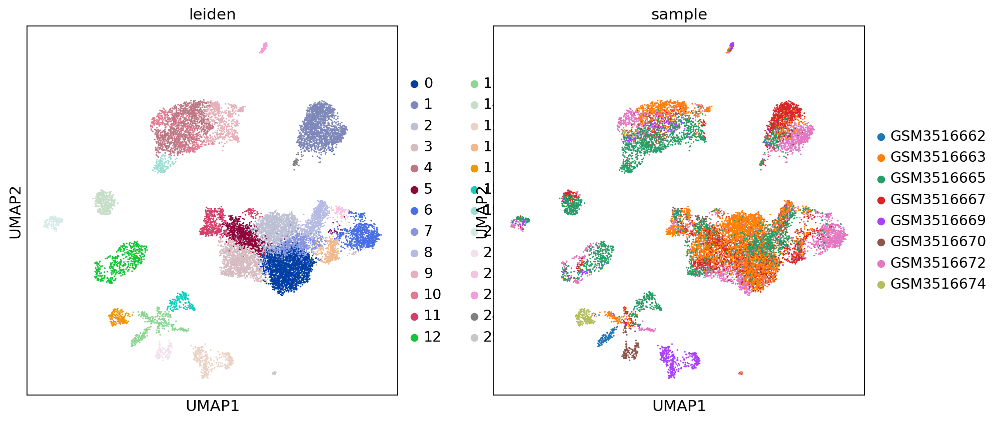

In [15]:
# sc.set_figure_params(figsize=(6, 6))
sc.pl.umap(
    adata,
    color=["leiden",'sample'],
    # legend_loc="on data",
)

In [4]:
# adata.write_h5ad(f'{backup_dir}/adata_cluster.h5ad')
adata = ad.read_h5ad(f'{backup_dir}/adata_cluster.h5ad')

## Cluster Annotation

### **ikarus**: Differentiate tumor and normal cells

Tumor cells have a very altered genetic signature so to annotate the cell types it is paramount to 
separate the tumor cells from the normal cells.

`ikarus` is a stepwise machine learning pipeline that tries to cope with a task of distinguishing tumor cells from normal cells. Leveraging multiple annotated single cell datasets it can be used to define a gene set specific to tumor cells. First, the latter gene set is used to rank cells and then to train a logistic classifier for the robust classification of tumor and normal cells. Finally, sensitivity is increased by propagating the cell labels based on a custom cell-cell network. 

`ikarus` is tested on multiple single cell datasets to ascertain that it achieves high sensitivity and specificity in multiple experimental contexts.

#### Signatures

Here we just define the path of our gene signatures of choice (find more information on how the gene lists are created here: ).

Note: It is important that the name (see first column in the example) of the gene lists within the signatures.gmt file correspond to the cell type for which they are meaningful. signatures.gmt is tab-separated.


In [6]:
url = "https://raw.githubusercontent.com/BIMSBbioinfo/ikarus/master/tutorials/out/signatures.gmt"
os.makedirs('out', exist_ok=True)
signatures_path = "out/signatures.gmt"
# gdown.download(url, signatures_path, quiet=False)
pd.read_csv(signatures_path, sep="\t", header=None)

,0,1,2,3,4,5,6,7,8,9,...,1305,1306,1307,1308,1309,1310,1311,1312,1313,1314
0,Normal,ikarus,RP11-128M1.1,TRAV8-2,PTPRD-AS1,MEOX2,CXCL12,KLRC4-KLRK1,BCAS1,SCNN1A,...,C22ORF15,CYP4F11,AK8,LRRC18,LMO2,COL12A1,ITGA11,EGFL6,RGS11,PCDHB15
1,Tumor,ikarus,RP11-277P12.10,RP13-895J2.6,BNC1,MAGEA6,ISX,MAGEA3,RP13-614K11.2,CDH7,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


We also download the the pretrained model which is based on the datasets by [Laughney et. al](https://www.nature.com/articles/s41591-019-0750-6) 
and [Lee et. al.](https://pubmed.ncbi.nlm.nih.gov/32451460/).
Which is a little bit redundant, but we are only taking a subset and this notebook is for demonstration puposes.

One can train the model on the dataset of choice. To see how to do that refer to the [tutorial](https://github.com/BIMSBbioinfo/ikarus/blob/master/tutorials/tutorial.ipynb).

In [7]:
url = "https://raw.githubusercontent.com/BIMSBbioinfo/ikarus/master/tutorials/out/core_model.joblib"
os.makedirs('out', exist_ok=True)
model_path = "out/core_model.joblib"
# gdown.download(url, model_path, quiet=False)

In [8]:
model = classifier.Ikarus(signatures_gmt=signatures_path, out_dir="out")
model.load_core_model(model_path)

#### make prediction

We provide the AnnData of our data set, make predictions and save the results.


In [9]:
adata.X = adata.layers['logcounts']

In [10]:
# This function works with the gene_symbol column, so we assign it
adata.var['gene_symbol'] = adata.var.index
_ = model.predict(adata, "laughney", save=True)

Process Process-1:
Process Process-2:
Traceback (most recent call last):
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
  File "/usr/local/lib/python3.11/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
  File "/usr/local/lib/python3.11/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)

KeyboardInterrupt

  File "/usr/local/lib/python3.11/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
  File "/usr/local/lib/python3.11/site-packages/pyscenic/aucell.py", line 95, in _enrichment
    ] = enrichment4cells(df_rnk, module, auc_threshold).values.ravel(order="C")
        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/site-packages/pyscenic/aucell.py", line 95, in _enrichment
    ] = enrichment4cells(df_rnk, module, auc_threshold).values.ravel(order="C")
        ^^^^^^

This next command computes the map but also creates the column for the colouring of the normal cells and the tumor cells

In [15]:
_ = model.get_umap(adata, "laughney", save=True)

converged at iteration step: 24 with 0.0007 < 0.001


Load prediction results and the AnnData object including the just computed UMAP coordinates.

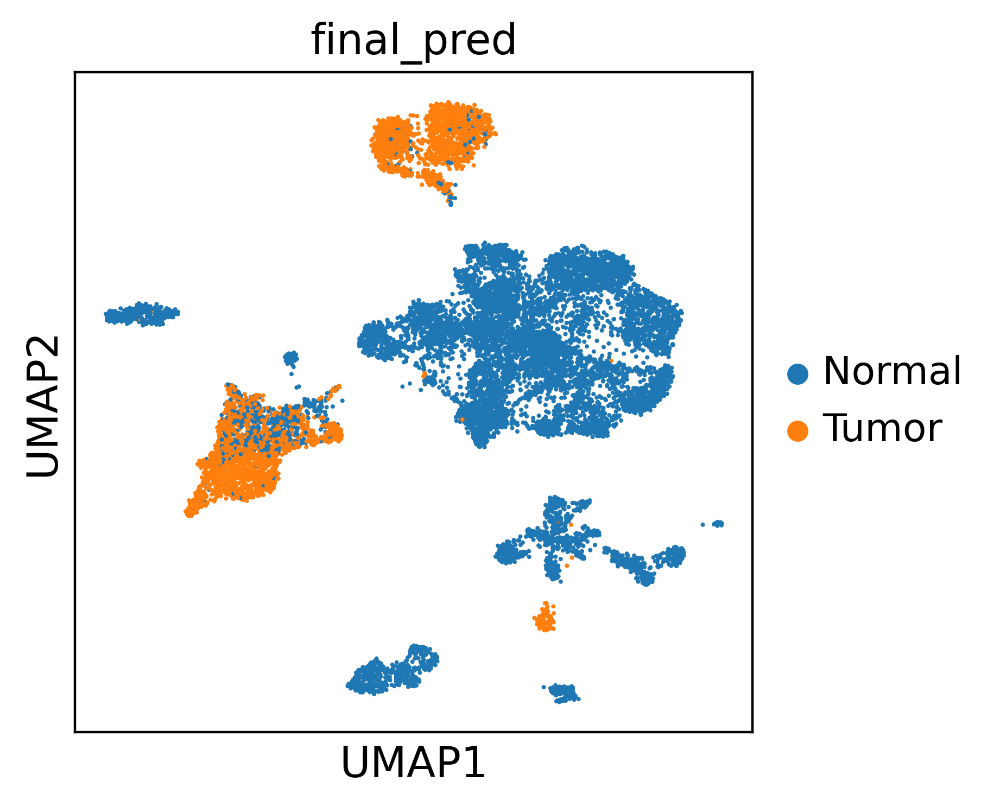

In [16]:
sc.pl.umap(adata, color=['final_pred'])

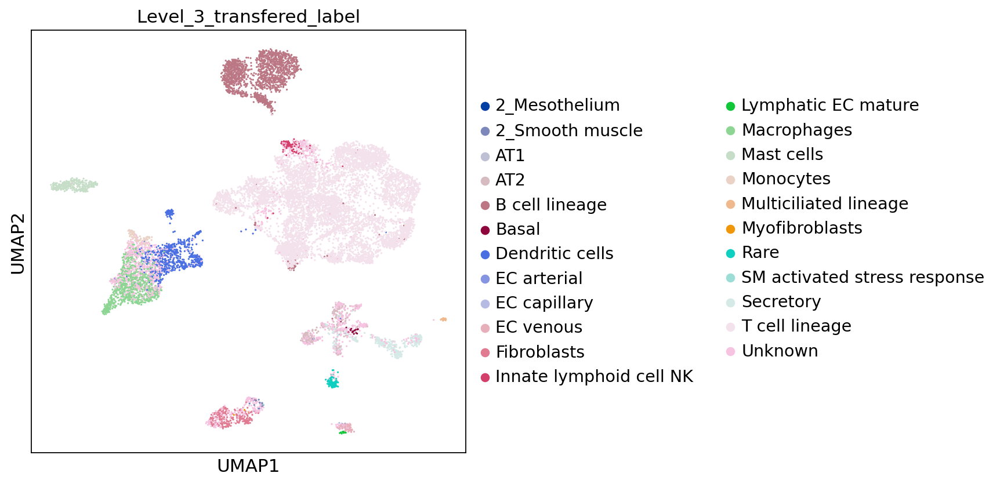

In [153]:
sc.pl.umap(adata, color=['Level_3_transfered_label'])

In [18]:
# path = "out/laughney"
# results = pd.read_csv(f'{path}/prediction.csv', index_col=0)
adata.write(f"{backup_dir}/adata_umap_ikarus.h5ad")
# adata = anndata.read_h5ad(f"{backup_dir}/adata_umap_ikarus.h5ad")

We procceed to annotate the cells that are normal, with a reference atlas.

### **scArches**: Automated annotation

scArches allows your single-cell query data to be analyzed by integrating it into a reference atlas. By mapping your data into an integrated reference you can transfer cell-type annotation from reference to query, identify disease states by mapping to healthy atlas, and advanced applications such as imputing missing data modalities or spatial locations.

For a more detailed walkthrough of the process go to https://docs.scarches.org/en/latest/hlca_map_classify.html

We base ourselves greatly in that notebook and copy some parts.

IT IS IMPORTANT THAT THE QUERY DATA IS IN RAW COUNTS, WE CHECK THAT HERE:


In [20]:
# adata.X[:10, :30].toarray()
adata.X = adata.layers['counts']

#### Load Query dataset

scArches uses a reference atlas, of which there are everytime more extensive ones.
An advantage of its approach is that one only has to save the weights of the trained neural network as 
a model file and a latent embedding of the atlas.

Based on that model the tool does a surgey by adjusting certain weights to the query data.
You have to download the model yourself as it would be very to add to the repo.

In [21]:
batch_key = 'dataset'
name = 'Laughney'
query_batch = [f'lung_{name}']
cell_type_key = 'scanvi_label'
ref_model_dir_prefix = f'/root/datos/maestria/netopaas/lung_scRNA/HCA_Lung/' # directory in which to store the reference model directory

surgery_model_dir_prefix = (
    ref_model_dir_prefix  # directory in which to store the surgery model directory
)
path_reference_emb = (
    f"{ref_model_dir_prefix}/HLCA_emb_and_metadata.h5ad"  # path to reference embedding to be created
)

# don't change the following paths:
ref_model_dir = os.path.join(
    ref_model_dir_prefix, "HLCA_reference_model"
)  # don't change this
surgery_model_dir = os.path.join(
    surgery_model_dir_prefix, "surgery_model"
)  # don't change this


#Important to check how many epochs would be ideal
surgery_epochs = 100
early_stopping_kwargs_surgery = {
    "early_stopping_monitor": "elbo_train",
    "early_stopping_patience": 10,
    "early_stopping_min_delta": 0.001,
    "plan_kwargs": {"weight_decay": 0.0},
}

We will start with downloading the needed model and data. First, let’s download the reference model, on which we will perform surgery. The HLCA reference model can be found on Zenodo, and we’ll download it below:

In [ ]:
# url = "https://zenodo.org/record/7599104/files/HLCA_reference_model.zip"
# output = "HLCA_reference_model.zip"
# gdown.download(url, output, quiet=False)
# shutil.unpack_archive("HLCA_reference_model.zip", extract_dir=ref_model_dir_prefix)
# os.remove(output)

We will furthermore download the reference itself. As scArches allows the mapping of query data onto an existing reference embedding, we will only need to download the embedding of the HLCA reference. That saves a lot of time and memory compared to downloading the full count matrix. It might take a while to download this embedding, it’s 2.3Gb in size.

In [ ]:
# url = "https://zenodo.org/record/7599104/files/HLCA_full_v1.1_emb.h5ad"
# output = path_reference_emb
# gdown.download(url, output, quiet=False)

In [22]:
adata_ref = sc.read_h5ad(path_reference_emb)

In [48]:
adata_query_unprep = adata[adata.obs['final_pred'] == 'Normal'].copy()

# We need RAW count data for the model we are using so we get it from adata.layers
#adata_query_unprep.X = adata_query_unprep.layers['counts']

For faster computation convert the matrix to sparse.
First check with `adata.X` if it is sparse

In [24]:
adata.X
# adata_query_unprep.X = sparse.csr_matrix(adata_query_unprep.X)

<14394x19614 sparse matrix of type '<class 'numpy.float32'>'
	with 23331857 stored elements in Compressed Sparse Row format>

#### Change to Ensembl IDs

Revert to ensemble ids using the assembly reference gch38 (or hg19 in the comments) used in the experiment.
Doing this via THE PACKAGE Biomart always leaves us with some gaps because there are many manually annotated genes.

If your query feature naming does not match your reference model feature naming, you will need to add the right feature names. For the HLCA reference, the mapping of the 2000 input gene IDs to their gene names is stored on the HLCA Zenodo page, so you can add gene ids using that mapping. Alternatively, you can map your gene IDs to gene names (or the reverse) using BioMart mapping tables. In most cases your raw data includes both gene IDs and names, in which case mapping is not necessary.

Let’s download the HLCA-specific gene mapping:

In [25]:
path_gene_mapping_df = f'{ref_model_dir_prefix}/HLCA_reference_model_gene_order_ids_and_symbols.csv'

In [18]:
# Download gene information from HLCA github:
# url = "https://zenodo.org/record/7599104/files/HLCA_reference_model_gene_order_ids_and_symbols.csv"
# gdown.download(url, path_gene_mapping_df, quiet=False)

Downloading...
From: https://zenodo.org/record/7599104/files/HLCA_reference_model_gene_order_ids_and_symbols.csv
To: /root/datos/maestria/netopaas/lung_scRNA/HCA_Lung/HLCA_reference_model_gene_order_ids_and_symbols.csv
45.1kB [00:00, 54.0MB/s]


'/root/datos/maestria/netopaas/lung_scRNA/HCA_Lung/HLCA_reference_model_gene_order_ids_and_symbols.csv'

In [49]:
gene_id_to_gene_name_df = pd.read_csv(path_gene_mapping_df, index_col=0)

# Store your gene names in an adata.var.column if they are currently the index:
# if gene names are in .var.index:
adata_query_unprep.var["gene_names"] = adata_query_unprep.var.index
gene_name_column_name = "gene_names"

Map gene names to gene ids for all of the 2000 reference model genes that we can find in our data:

Check number of detected genes:

In [50]:
n_overlap = (
    adata_query_unprep.var[gene_name_column_name]
    .isin(gene_id_to_gene_name_df.gene_symbol)
    .sum()
)
n_genes_model = gene_id_to_gene_name_df.shape[0]
print(
    f"Number of model input genes detected: {n_overlap} out of {n_genes_model} ({round(n_overlap/n_genes_model*100)}%)"
)

Number of model input genes detected: 1887 out of 2000 (94%)


Subset query data to only the genes that are part of the modeling input, then map gene names to gene ids using the table above. Store the resulting ids both in the .var.index (for scArches) and in a .var[gene_ids] (for merging duplicate genes).

In [51]:
adata_query_unprep = adata_query_unprep[
    :,
    adata_query_unprep.var[gene_name_column_name].isin(
        gene_id_to_gene_name_df.gene_symbol
    ),
].copy()  # subset your data to genes used in the reference model
adata_query_unprep.var.index = adata_query_unprep.var[gene_name_column_name].map(
    dict(zip(gene_id_to_gene_name_df.gene_symbol, gene_id_to_gene_name_df.index))
)  # add gene ids for the gene names, and store in .var.index
# remove index name to prevent bugs later on
adata_query_unprep.var.index.name = None
adata_query_unprep.var["gene_ids"] = adata_query_unprep.var.index


In [52]:
adata_query_unprep.var.head(3)

,mt,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,total_counts,log1p_total_counts,n_counts,highly_deviant,binomial_deviance,...,means,dispersions,dispersions_norm,n_cells,triku_distance,triku_distance_uncorrected,triku_highly_variable,gene_symbol,gene_names,gene_ids
ENSG00000121410,False,2210,0.141165,0.132049,88.858079,2800.0,7.937732,2800.0,True,9390.896821,...,0.275423,1.090707,0.161061,2035,-0.145388,0.443881,False,A1BG,A1BG,ENSG00000121410
ENSG00000175899,False,1931,0.417746,0.349069,90.264684,8286.0,9.022444,8286.0,True,30887.709746,...,0.629190,3.940535,2.366717,1774,4.079514,4.634637,True,A2M,A2M,ENSG00000175899
ENSG00000165029,False,1233,0.101336,0.096524,93.783716,2010.0,7.606388,2010.0,False,7459.755066,...,0.143733,1.344882,0.600231,1125,2.751230,3.291878,True,ABCA1,ABCA1,ENSG00000165029


In [53]:
def sum_by(adata: ad.AnnData, col: str) -> ad.AnnData:
    adata.obs[col] = adata.obs[col].astype('category')
    assert pd.api.types.is_categorical_dtype(adata.obs[col])

    cat = adata.obs[col].values
    indicator = sparse.coo_matrix(
        (np.broadcast_to(True, adata.n_obs), (cat.codes, np.arange(adata.n_obs))),
        shape=(len(cat.categories), adata.n_obs),
    )

    return ad.AnnData(
        indicator @ adata.X, var=adata.var, obs=pd.DataFrame(index=cat.categories)
    )

shape before merging:

Now merge. Note that all var columns will be dropped after merging (as we don’t specify how to merge). As the merging is done based on .obs indices in the function above, we transpose our anndata object and re-transpose it after merging.

In [54]:
adata_query_unprep = sum_by(adata_query_unprep.transpose(), col="gene_ids").transpose()

In [55]:
adata_query_unprep.shape

(10978, 1887)

add back gene ids:

In [56]:
adata_query_unprep.var = adata_query_unprep.var.join(gene_id_to_gene_name_df).rename(columns={"gene_symbol":"gene_names"})

#### Surgery

We pad missing query genes with zeros and reorder the available ones to ensure data corectness and smooth running of the scArches reference mapping.

In [57]:
adata_query = sca.models.SCANVI.prepare_query_anndata(
    adata = adata_query_unprep,
    # return_reference_var_names=True,
    reference_model = ref_model_dir,
    inplace=False)

INFO     File /root/datos/maestria/netopaas/lung_scRNA/HCA_Lung/HLCA_reference_model/model.pt already downloaded   
INFO     Found 94.35% reference vars in query data.                                                                


This line should be kept unchanged due to the structure of the pre-trained reference model.

In [58]:
adata_query.obs['scanvi_label'] = 'unlabeled'

Now we perform scArches “surgery”.

Note: if you use gene names rather than ensembl IDs in your query_data.var.index, you will get a warning that your genes (var_names) do not match the training genes. You can ignore this warning, as long as you have done the gene check in the beginning of the notebook.

In [59]:
from scvi.model.base._utils import _load_saved_files
attr_dict, var_names, model_state_dict, adata_ = _load_saved_files(ref_model_dir, load_adata=False, map_location='cpu')

INFO     File /root/datos/maestria/netopaas/lung_scRNA/HCA_Lung/HLCA_reference_model/model.pt already downloaded   


Thanks to exploring the model we can deduce what .obs we need and the name we assigned. In this case we need to define a 'dataset'
column in obs to define the batches.

We can load the model with this command or train it if we havent got it

In [60]:
adata_query.obs['dataset'] = adata_query.obs['sample']
adata_query.obs['sample'] = adata_query.obs['sample'].astype('string')
adata_query.obs['dataset'] = adata_query.obs['dataset'].astype('string')

We convert all cetogrical types to strings to be abl to save into an h5ad file.
Sometimes we have to run this command after trying to save strangely.

In [63]:
for col in adata_query.obs.columns:
    if pd.api.types.is_categorical_dtype(adata_query.obs[col]):
        adata_query.obs[col] = adata_query.obs[col].astype('str')


In [64]:
# Convert all mito falgs into false because we are using the latent genes of the HCA_lung model
# adata_query = sc.read_h5ad(f'{backup_dir}/surgeries/query_{name}.h5ad')
adata_query.var.mito = False
os.makedirs(f'{backup_dir}/surgeries', exist_ok=True)
adata_query.write_h5ad(f'{backup_dir}/surgeries/query_{name}.h5ad')

Apparently we have to aks for cuda availability explicitly for scArches to recognize that we have GPU

In [65]:
import torch
torch.cuda.is_available()

True

In [66]:
surgery_model = sca.models.SCANVI.load_query_data(
        adata_query,
        ref_model_dir,
        freeze_dropout = True,
    )

INFO     File /root/datos/maestria/netopaas/lung_scRNA/HCA_Lung/HLCA_reference_model/model.pt already downloaded   


In [67]:
%%time
surgery_model.train(
     max_epochs=surgery_epochs,
    **early_stopping_kwargs_surgery
)

INFO     Training for 100 epochs.                                                                                  


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 100/100: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [04:05<00:00,  2.46s/it, v_num=1, train_loss_step=729, train_loss_epoch=644]

INFO: `Trainer.fit` stopped: `max_epochs=100` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=100` reached.


Epoch 100/100: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [04:05<00:00,  2.46s/it, v_num=1, train_loss_step=729, train_loss_epoch=644]
CPU times: user 4min 5s, sys: 993 ms, total: 4min 6s
Wall time: 4min 6s


In [68]:
surgery_model.save(f'{backup_dir}/surgeries/{name}', overwrite=True)
# surgery_model = sca.models.SCANVI.load(f'{backup_dir}/surgeries/{name}/', adata_query)

#### Get latent representation
Here we will calculate the “latent representation”, or “low-dimensional embedding” of your dataset. This embedding is in the same space as the HLCA core/reference embedding that you loaded in the beginning of the script. Hence, we can combine the two embeddings afterwards (HLCA + your new data), and do joint clustering, UMAP embedding, label transfer etc.!

In [79]:
adata_query_latent = sc.AnnData(surgery_model.get_latent_representation(adata_query))
adata_query_latent.obs = adata_query.obs.loc[adata_query.obs.index,:]

In [70]:
# adata_query_latent.write_h5ad(f'{backup_dir}/surgeries/latent_{name}.h5ad')
adata_query_latent = sc.read_h5ad(f'{backup_dir}/surgeries/latent_{name}.h5ad')

#### Combine embeddings
We add “reference or query” metadata to acquire more information and better analyse the integration level.

In [80]:
adata_query_latent.obs['ref_or_query'] = "query"
adata_ref.obs['ref_or_query'] = "ref"

We will now combine the two embeddings to enable joing clustering etc. If you expect non-unique barcodes (.obs index), set index_unique to e.g. “_” and batch_key to the obs column that you want to use as barcode suffix (e.g. “dataset”).

In [81]:
combined_emb = adata_ref.concatenate(adata_query_latent, index_unique=None) # index_unique="_", batch_key="dataset") # alternative

In [82]:
# We save the combined embeddings (optional).
combined_emb.write_h5ad(f'{backup_dir}/surgeries/combined_normal_{name}.h5ad')
# combined_emb = sc.read_h5ad(f'{backup_dir}/surgeries/combined_normal_{name}.h5ad')

Note that if wanted, this embedding can be added to the full, joint HLCA + query data object (including gene counts). The full HLCA, including normalized counts is publicly available. For now, we will just work with the embedding, since that is all we need to perform joint plotting and label transfer.

#### Label transfer
Next, we use a knn classifier to transfer the lables from the reference to the query. We do this for every level of the annotation (i.e. level 1-5). Note that some cell types don’t have annotations for higher levels, e.g. mast cells do not have level 4 or 5 annotations. For those cell types, we “propagate” to the higher levels, i.e. you will see “3_Mast cells” in level 4 and 5 annotations. (Most cell types don’t have a level 5 annotation!) Therefore, all highest level annotations can be found under level 5.

In [83]:
celltypes = f'{ref_model_dir_prefix}/HLCA_celltypes_ordered.csv'

In [84]:
# url = 'https://github.com/LungCellAtlas/mapping_data_to_the_HLCA/raw/main/supporting_files/HLCA_celltypes_ordered.csv'
# gdown.download(url, celltypes, quiet=False)

In [85]:
cts_ordered = pd.read_csv(celltypes,index_col=0)

In [86]:
#Now run the label transfer commands. Note that this might take quite a while if you have a large query dataset! For our small test dataset, it should not take long.

knn_transformer = sca.utils.knn.weighted_knn_trainer(
    train_adata=adata_ref,
    train_adata_emb="X",
    n_neighbors=50,
)

Weighted KNN with n_neighbors = 50 ... 

In [87]:
%%time

labels, uncert = sca.utils.knn.weighted_knn_transfer(
    query_adata=adata_query_latent,
    query_adata_emb="X", # location of our joint embedding
    label_keys="Level",
    knn_model=knn_transformer,
    ref_adata_obs = adata_ref.obs.join(cts_ordered, on='ann_finest_level')
    )

finished!
CPU times: user 1min 40s, sys: 862 ms, total: 1min 41s
Wall time: 19.2 s


With the commands above, we labeled every cell from the query. However, some cells might have high label transfer uncertainty. It is useful to set those to “unknown” instead of giving them a cell type label. This will help highlight cell types/states that are new (i.e. not present in the reference) and possible interesting, they’re worth taking a careful look at!

This uncertainty threshold limits the false positive rate to <0.5 (as per Sikkema et al., bioRxiv 2022)

In [88]:
uncertainty_threshold = 0.2

In [89]:
labels.rename(columns={f'Level_{lev}':f'Level_{lev}_transfered_label_unfiltered' for lev in range(1,6)},inplace=True)
uncert.rename(columns={f'Level_{lev}':f'Level_{lev}_transfer_uncert' for lev in range(1,6)},inplace=True)

combined_emb.obs = combined_emb.obs.join(labels)
combined_emb.obs = combined_emb.obs.join(uncert)

In [90]:
t_labels = [f'Level_{lev}_transfered_label_unfiltered' for lev in range(1,6)]
t_uncert = [f'Level_{lev}_transfer_uncert' for lev in range(1,6)]

Convert uncertainties to arrays

In [91]:
combined_emb.obs[t_uncert] = list(np.array(combined_emb.obs[t_uncert]))

Convert cell type labels to categoricals, and set “nan” to NaN

In [92]:
def remove_uncert_types(combined_emb):
    import pandas as pd
    t_labels = [f'Level_{lev}_transfered_label_unfiltered' for lev in range(1,6)]
    t_uncert = [f'Level_{lev}_transfer_uncert' for lev in range(1,6)]
    
    combined_emb.obs[t_uncert] = list(np.array(combined_emb.obs[t_uncert]))

    for col, uncert in zip(t_labels,t_uncert):
        filtered_colname = col.replace('_unfiltered','')
        # too high uncertainty levels => set to "Unknown"
        combined_emb.obs[filtered_colname] = combined_emb.obs[col]
        combined_emb.obs[filtered_colname] = combined_emb.obs[filtered_colname].astype('str')
        combined_emb.obs[filtered_colname].mask(
            combined_emb.obs[uncert] > uncertainty_threshold,
            'Unknown',
            inplace = True)

        # convert to categorical:
        combined_emb.obs[col] = pd.Categorical(combined_emb.obs[col])
        combined_emb.obs[filtered_colname] = pd.Categorical(combined_emb.obs[filtered_colname])
        # then replace "nan" with NaN (that makes colors better in umap)
        combined_emb.obs[col].replace('nan',np.nan,inplace=True)
        combined_emb.obs[filtered_colname].replace('nan',np.nan,inplace=True)
    return combined_emb

In [93]:
remove_uncert_types(combined_emb)

AnnData object with n_obs × n_vars = 595862 × 30
    obs: 'sample', 'study_long', 'study', 'last_author_PI', 'subject_ID', 'sex', 'ethnicity', 'mixed_ethnicity', 'smoking_status', 'BMI', 'condition', 'subject_type', 'sample_type', 'single_cell_platform', "3'_or_5'", 'sequencing_platform', 'cell_ranger_version', 'fresh_or_frozen', 'dataset', 'anatomical_region_level_1', 'anatomical_region_level_2', 'anatomical_region_level_3', 'anatomical_region_highest_res', 'age', 'ann_highest_res', 'n_genes', 'log10_total_counts', 'mito_frac', 'ribo_frac', 'original_ann_level_1', 'original_ann_level_2', 'original_ann_level_3', 'original_ann_level_4', 'original_ann_level_5', 'scanvi_label', 'leiden_1', 'leiden_2', 'leiden_3', 'anatomical_region_ccf_score', 'entropy_study_leiden_3', 'entropy_dataset_leiden_3', 'entropy_subject_ID_leiden_3', 'entropy_original_ann_level_1_leiden_3', 'entropy_original_ann_level_2_clean_leiden_3', 'entropy_original_ann_level_3_clean_leiden_3', 'entropy_original_ann_level_4

Let’s take a look at the percentage of cells set to “unknown” after our filtering:

In [94]:
print(f'Percentage of unknown per level, with uncertainty_threshold={uncertainty_threshold}:')
for level in range(1,6):
    print(f"Level {level}: {np.round(sum(combined_emb.obs[f'Level_{level}_transfered_label'] =='Unknown')/adata_query.n_obs*100,2)}%")



Percentage of unknown per level, with uncertainty_threshold=0.2:
Level 1: 0.18%
Level 2: 4.35%
Level 3: 10.45%
Level 4: 26.71%
Level 5: 26.84%


### UMAP

The UMAP plots help us perform downstream analysis, like clustering, label transfer, integration and more.

#### UMAP Query vs. Reference

In [95]:
# We save the combined embeddings (optional).
combined_emb.write_h5ad(f'{backup_dir}/surgeries/combined_normal_{name}.h5ad')
# combined_emb = sc.read_h5ad(f'{backup_dir}/surgeries/combined_normal_{name}.h5ad')

In [96]:
sc.pp.neighbors(combined_emb, n_neighbors=30)
sc.tl.umap(combined_emb)

In [97]:
# We save the combined embeddings (optional).
combined_emb.write_h5ad(f'{backup_dir}/surgeries/combined_normal_{name}.h5ad')
# combined_emb = sc.read_h5ad(f'{backup_dir}/surgeries/combined_normal_{name}.h5ad')

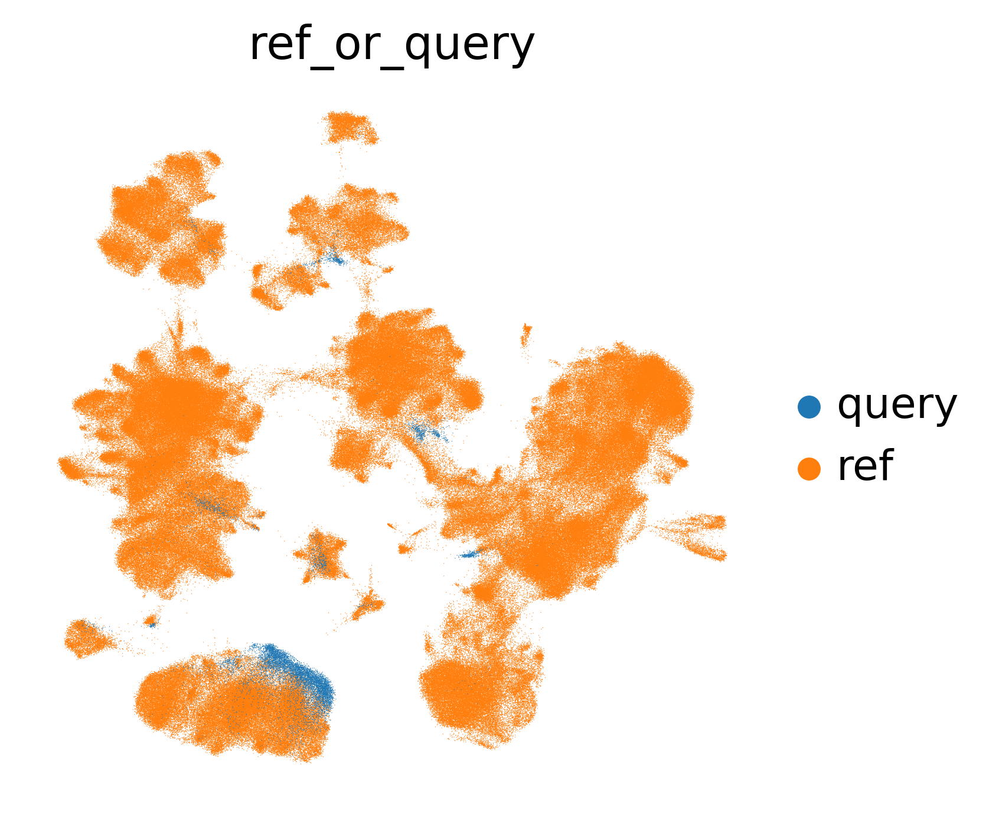

In [98]:
sc.pl.umap(
        combined_emb,
        color='ref_or_query',
        frameon=False,
        wspace=0.6
        )

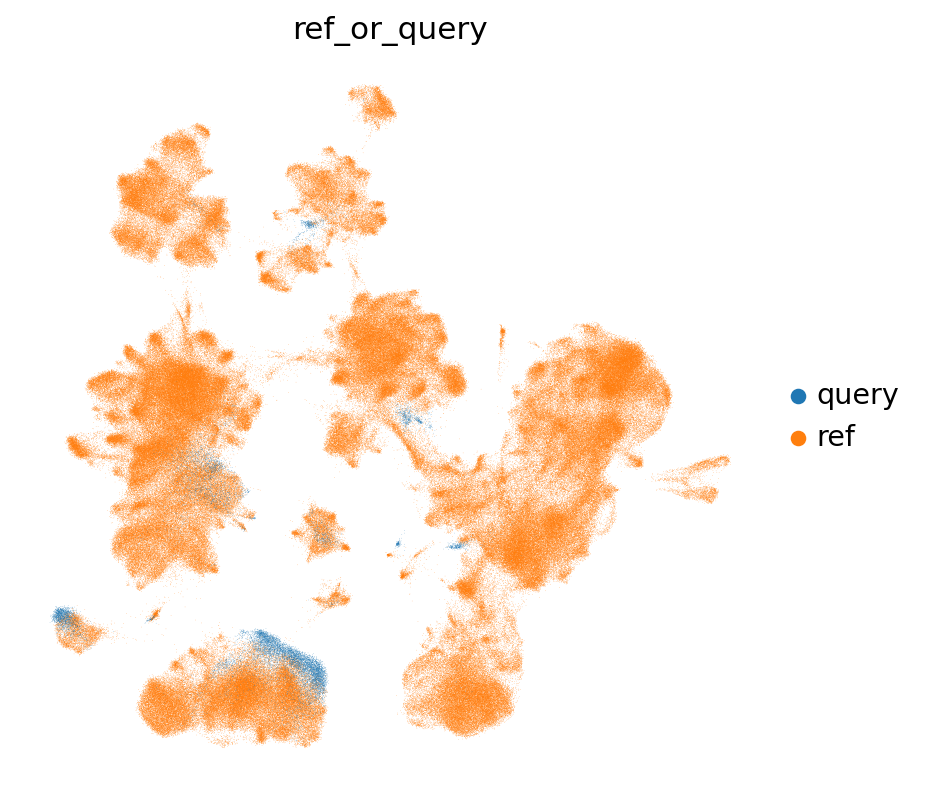

In [62]:
sc.pl.umap(
        combined_emb,
        color='ref_or_query',
        frameon=False,
        wspace=0.6
        )

#### UMAP Uncertainties

Here we show label transfer uncertainties per level. Regions with high uncertainty can highlight interesting cell types/states, not present in the reference. Note that uncertainties will get higher, the more detailed we go:

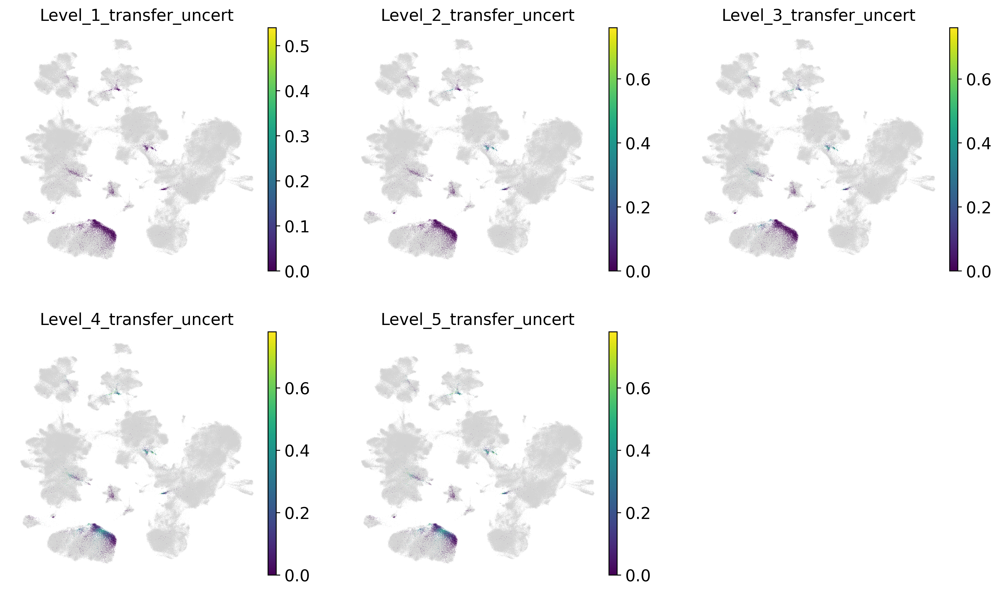

In [99]:
sc.pl.umap(
    combined_emb,
    color=[f'Level_{lev}_transfer_uncert' for lev in range(1,6)],
    ncols=3,
    frameon=False,
    )

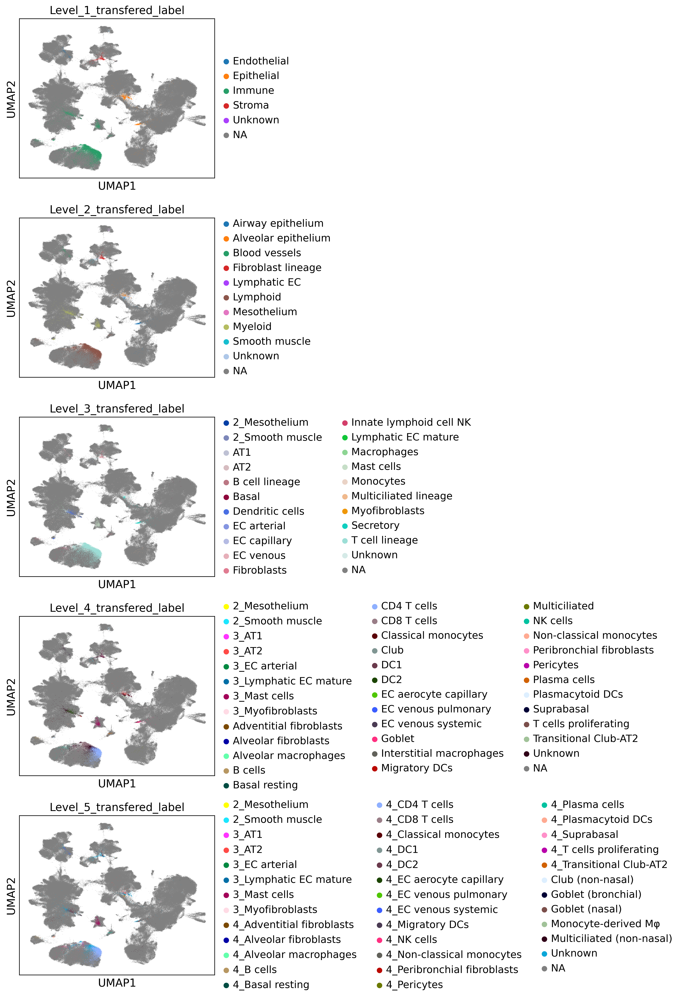

In [100]:
sc.pl.umap(
        combined_emb,
        color=[f"Level_{lev}_transfered_label" for lev in range(1,6)],
        na_color="grey",
        ncols=1,
        size=0.5
)

We can see that there are many lymphoid cells, but it is difficult to see exactly what specfic kind
Let's observe only those lymphocytes.

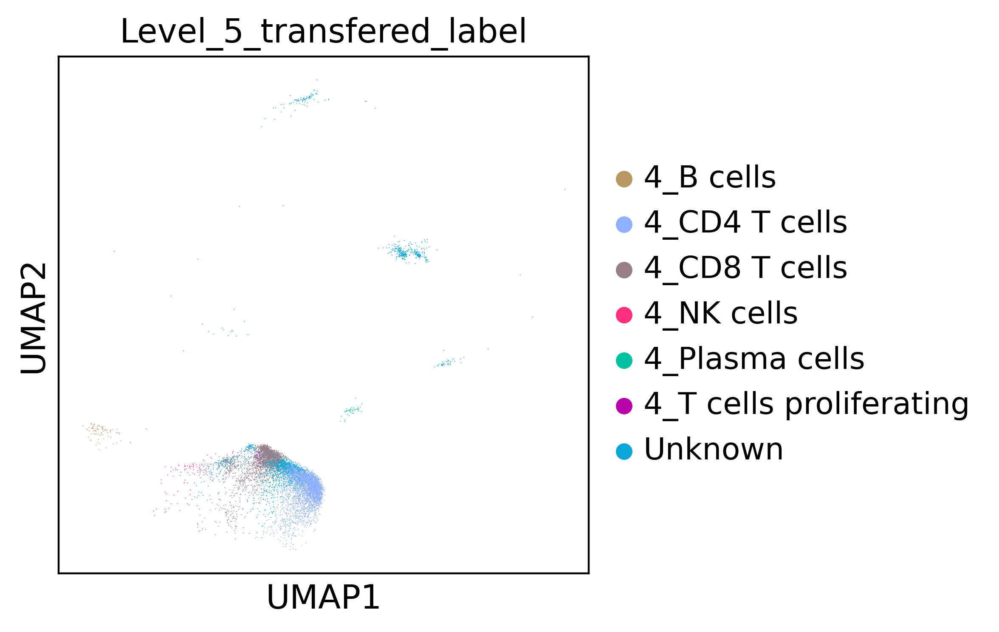

In [101]:
sc.pl.umap(
        combined_emb[(combined_emb.obs['Level_2_transfered_label'] == 'Lymphoid') | (combined_emb.obs['Level_2_transfered_label'] == 'Unknown')],
        color=["Level_5_transfered_label"],
        na_color="grey",
        ncols=1,
        size=0.5
)

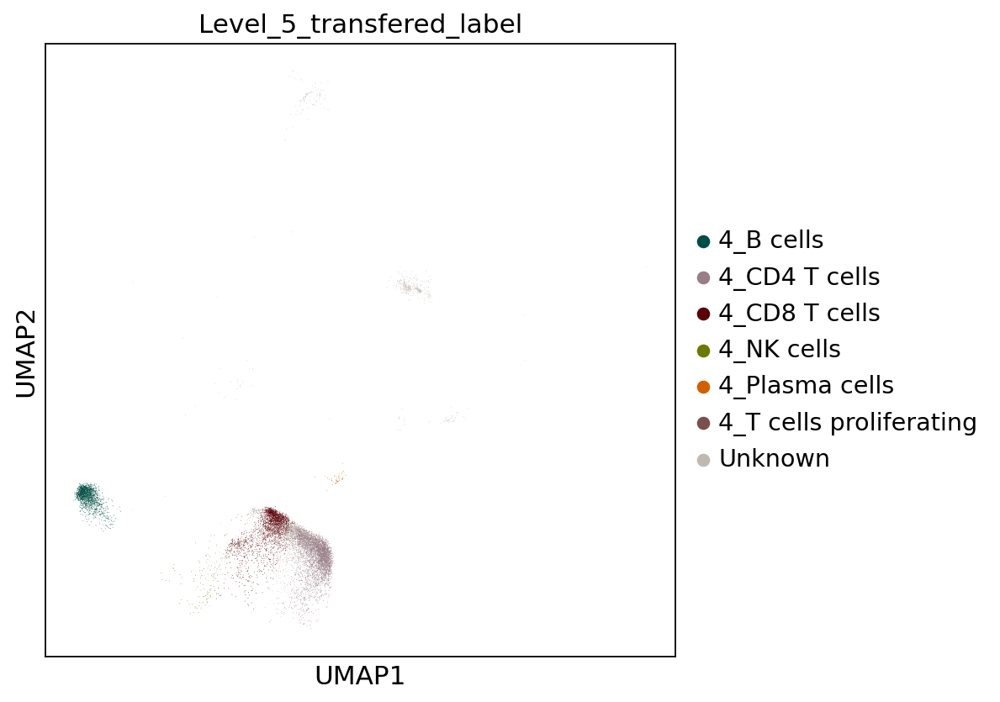

In [74]:
sc.pl.umap(
        combined_emb[(combined_emb.obs['Level_2_transfered_label'] == 'Lymphoid') | (combined_emb.obs['Level_2_transfered_label'] == 'Unknown')],
        color=["Level_5_transfered_label"],
        na_color="grey",
        ncols=1,
        size=0.5
)

As we can see we have mostly Cd8 and B cells. So we have a very active adaptive inmunogenic response. There also lots of cells for which the unvertainty is too high. 
This can be due to the being cancer cells.

Transfer the `.obs` columns of interest to our adta object for further study

In [94]:
adata.obs = pd.concat([adata.obs,
           combined_emb.obs.query('sample.str.startswith("GSM")').
               filter(regex='d_label$')],
          axis=1)

In [95]:
# adata.write_h5ad(f'{backup_dir}/annotated_{name}.h5ad')
ad.read_csv(f'{backup_dir}/annotated_{name}.h5ad')

## Trajectory Inference

Even though the precise definition of cell types though their transcriptomic fingerprint is an important breakthrough,
the point can be made that a cell is never really a defined type and is in a continuum of varying physiology.

In neoplasic tissue this is very much the case as is also the case in a growing organism or in hematopoeisis. 

That is what motivated the development of algorithms to infer a possible trajectory of development.

When considering what approach to use, an important factor is the expected trajectory
of cell differentiation. One type of cell can differentiate into 
multiple types of cells (multi-branching) or just two (bifurcation), there can 
be a dedifferentiation process (cycles)
and a group of cells could not have a common progeny with another group of cells 
(disconnected). This is referred to as the topology of the trajectory 
(represented by a graph) and there are algorithms that
can try to deduce it, or one can specify the topology. Another biological 
constituent that is considered is the specification of a starting cell and
or end cell. 
When the expected topology is unknown, trajectories and downstream hypotheses 
should be confirmed by multiple trajectory inference methods using different 
underlying assumptions. A very thorough and updated resource,
[dynverse](http://guidelines.dynverse.org/), has a decision tree to help
decide what analysis to use. Outstanding mentions include **PAGA** (Wolf2019) for free
trajectories, **PAGA Tree** and **Slingshot** (Street 2018) for tree like trajectories.

We decide to use PAGA to explore the free trajectories, as there are many possible fates in
a neoplasic tissue. Also,  PAGA does no only use pseuo-temporal ordering. Because pseudotemporal ordering [2, 5–9] faces the
problem that biological processes are usually incompletely sampled. As a consequence, experimental data 
do not conform with a connected manifold and the modeling of data as a continuous tree structure, which is the basis 
for existing algorithms, has little meaning.

### **PAGA**: Free trajectories

Now that we have our data, we can visualise it. PAGA's preferred visualisation is the Fruchterman & Reingold algorithm (obtained via `sc.tl.draw_graph()` below), but Scanpy has many other options for visualizing the data. We precompute the visualisations to begin with, and then add this extra information to our constantly expanding `.h5ad` result archive.


## Differential Expression and Gene Set Enrichment

## Networks

## Conclusions